**Корректность проверена на Python 3.6:**
+ numpy 1.15.4
+ pandas 0.23.4

# Линейная регрессия и стохастический градиентный спуск

Задание основано на материалах лекций по линейной регрессии и градиентному спуску. Вы будете прогнозировать выручку компании в зависимости от уровня ее инвестиций в рекламу по TV, в газетах и по радио.

## Вы научитесь:
- решать задачу восстановления линейной регрессии
- реализовывать стохастический градиентный спуск для ее настройки
- решать задачу линейной регрессии аналитически

## Введение
Линейная регрессия - один из наиболее хорошо изученных методов машинного обучения, позволяющий прогнозировать значения количественного признака в виде линейной комбинации прочих признаков с параметрами - весами модели. Оптимальные (в смысле минимальности некоторого функционала ошибки) параметры линейной регрессии можно найти аналитически с помощью нормального уравнения или численно с помощью методов оптимизации.  

Линейная регрессия использует простой функционал качества - среднеквадратичную ошибку. Мы будем работать с выборкой, содержащей 3 признака. Для настройки параметров (весов) модели решается следующая задача:
$$\Large \frac{1}{\ell}\sum_{i=1}^\ell{{((w_0 + w_1x_{i1} + w_2x_{i2} +  w_3x_{i3}) - y_i)}^2} \rightarrow \min_{w_0, w_1, w_2, w_3},$$
где $x_{i1}, x_{i2}, x_{i3}$ - значения признаков $i$-го объекта, $y_i$ - значение целевого признака $i$-го объекта, $\ell$ - число объектов в обучающей выборке.

## Градиентный спуск
Параметры $w_0, w_1, w_2, w_3$, по которым минимизируется среднеквадратичная ошибка, можно находить численно с помощью градиентного спуска.
Градиентный шаг для весов будет выглядеть следующим образом:
$$\Large w_0 \leftarrow w_0 - \frac{2\eta}{\ell} \sum_{i=1}^\ell{{((w_0 + w_1x_{i1} + w_2x_{i2} +  w_3x_{i3}) - y_i)}}$$
$$\Large w_j \leftarrow w_j - \frac{2\eta}{\ell} \sum_{i=1}^\ell{{x_{ij}((w_0 + w_1x_{i1} + w_2x_{i2} +  w_3x_{i3}) - y_i)}},\ j \in \{1,2,3\}$$
Здесь $\eta$ - параметр, шаг градиентного спуска.

## Стохастический градиентный спуск
Проблема градиентного спуска, описанного выше, в том, что на больших выборках считать на каждом шаге градиент по всем имеющимся данным может быть очень вычислительно сложно. 
В стохастическом варианте градиентного спуска поправки для весов вычисляются только с учетом одного случайно взятого объекта обучающей выборки:
$$\Large w_0 \leftarrow w_0 - \frac{2\eta}{\ell} {((w_0 + w_1x_{k1} + w_2x_{k2} +  w_3x_{k3}) - y_k)}$$
$$\Large w_j \leftarrow w_j - \frac{2\eta}{\ell} {x_{kj}((w_0 + w_1x_{k1} + w_2x_{k2} +  w_3x_{k3}) - y_k)},\ j \in \{1,2,3\},$$
где $k$ - случайный индекс, $k \in \{1, \ldots, \ell\}$.

## Нормальное уравнение 
Нахождение вектора оптимальных весов $w$ может быть сделано и аналитически.
Мы хотим найти такой вектор весов $w$, чтобы вектор $y$, приближающий целевой признак, получался умножением матрицы $X$ (состоящей из всех признаков объектов обучающей выборки, кроме целевого) на вектор весов $w$. То есть, чтобы выполнялось матричное уравнение:
$$\Large y = Xw$$
Домножением слева на $X^T$ получаем:
$$\Large X^Ty = X^TXw$$
Это хорошо, поскольку теперь матрица $X^TX$ - квадратная, и можно найти решение (вектор $w$) в виде:
$$\Large w = {(X^TX)}^{-1}X^Ty$$
Матрица ${(X^TX)}^{-1}X^T$ - [*псевдообратная*](https://ru.wikipedia.org/wiki/Псевдообратная_матрица) для матрицы $X$. В NumPy такую матрицу можно вычислить с помощью функции [numpy.linalg.pinv](http://docs.scipy.org/doc/numpy-1.10.0/reference/generated/numpy.linalg.pinv.html).

Однако, нахождение псевдообратной матрицы - операция вычислительно сложная и нестабильная в случае малого определителя матрицы $X$ (проблема мультиколлинеарности). 
На практике лучше находить вектор весов $w$ решением матричного уравнения 
$$\Large X^TXw = X^Ty$$Это может быть сделано с помощью функции [numpy.linalg.solve](http://docs.scipy.org/doc/numpy-1.10.1/reference/generated/numpy.linalg.solve.html).

Но все же на практике для больших матриц $X$ быстрее работает градиентный спуск, особенно его стохастическая версия.

## Инструкции по выполнению

**1. Загрузите данные из файла *advertising.csv* в объект pandas DataFrame. [Источник данных](http://www-bcf.usc.edu/~gareth/ISL/data.html).**

In [3]:
import pandas as pd
adver_data = pd.read_csv('advertising.csv')

**Посмотрите на первые 5 записей и на статистику признаков в этом наборе данных.**

In [4]:
# Ваш код здесь
adver_data.head()

,TV,Radio,Newspaper,Sales
1,230.1,37.8,69.2,22.1
2,44.5,39.3,45.1,10.4
3,17.2,45.9,69.3,9.3
4,151.5,41.3,58.5,18.5
5,180.8,10.8,58.4,12.9


In [5]:
# Ваш код здесь
adver_data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
TV,200.0,147.0425,85.854236,0.7,74.375,149.75,218.825,296.4
Radio,200.0,23.2640,14.846809,0.0,9.975,22.90,36.525,49.6
Newspaper,200.0,30.5540,21.778621,0.3,12.750,25.75,45.100,114.0
Sales,200.0,14.0225,5.217457,1.6,10.375,12.90,17.400,27.0


**Создайте массивы NumPy *X* из столбцов TV, Radio и Newspaper и *y* - из столбца Sales. Используйте атрибут *values* объекта pandas DataFrame.**

In [6]:
import numpy as np
X = np.array(adver_data[['TV', 'Radio', 'Newspaper']])
y = np.array(adver_data['Sales'])

**Отмасштабируйте столбцы матрицы *X*, вычтя из каждого значения среднее по соответствующему столбцу и поделив результат на стандартное отклонение. Для определенности, используйте методы mean и std векторов NumPy (реализация std в Pandas может отличаться). Обратите внимание, что в numpy вызов функции .mean() без параметров возвращает среднее по всем элементам массива, а не по столбцам, как в pandas. Чтобы произвести вычисление по столбцам, необходимо указать параметр axis.**

In [7]:
means, stds = X.mean(axis=0), X.std(axis=0)

In [8]:
means, stds

(array([147.0425,  23.264 ,  30.554 ]),
 array([85.63933176, 14.80964564, 21.72410606]))

In [9]:
for i in range(X.shape[0]):
    for j in range(X.shape[1]):
        X[i][j] = (X[i][j] - 1.0 * means[j]) / stds[j]

In [10]:
X

array([[ 9.69852266e-01,  9.81522472e-01,  1.77894547e+00],
       [-1.19737623e+00,  1.08280781e+00,  6.69578760e-01],
       [-1.51615499e+00,  1.52846331e+00,  1.78354865e+00],
       [ 5.20496822e-02,  1.21785493e+00,  1.28640506e+00],
       [ 3.94182198e-01, -8.41613655e-01,  1.28180188e+00],
       [-1.61540845e+00,  1.73103399e+00,  2.04592999e+00],
       [-1.04557682e+00,  6.43904671e-01, -3.24708413e-01],
       [-3.13436589e-01, -2.47406325e-01, -8.72486994e-01],
       [-1.61657614e+00, -1.42906863e+00, -1.36042422e+00],
       [ 6.16042873e-01, -1.39530685e+00, -4.30581584e-01],
       [-9.45155670e-01, -1.17923146e+00, -2.92486143e-01],
       [ 7.90028350e-01,  4.96973404e-02, -1.22232878e+00],
       [-1.43908760e+00,  7.99208859e-01,  1.62704048e+00],
       [-5.78501712e-01, -1.05768905e+00, -1.07502697e+00],
       [ 6.66253447e-01,  6.50657027e-01,  7.11007392e-01],
       [ 5.64664612e-01,  1.65000572e+00,  1.02862691e+00],
       [-9.25304978e-01,  9.00494200e-01

**Добавьте к матрице *X* столбец из единиц, используя методы *hstack*, *ones* и *reshape* библиотеки NumPy. Вектор из единиц нужен для того, чтобы не обрабатывать отдельно коэффициент $w_0$ линейной регрессии.**

In [11]:
import numpy as np
X = np.hstack([np.ones((X.shape[0])).reshape(X.shape[0], 1), X])

In [12]:
X

array([[ 1.00000000e+00,  9.69852266e-01,  9.81522472e-01,
         1.77894547e+00],
       [ 1.00000000e+00, -1.19737623e+00,  1.08280781e+00,
         6.69578760e-01],
       [ 1.00000000e+00, -1.51615499e+00,  1.52846331e+00,
         1.78354865e+00],
       [ 1.00000000e+00,  5.20496822e-02,  1.21785493e+00,
         1.28640506e+00],
       [ 1.00000000e+00,  3.94182198e-01, -8.41613655e-01,
         1.28180188e+00],
       [ 1.00000000e+00, -1.61540845e+00,  1.73103399e+00,
         2.04592999e+00],
       [ 1.00000000e+00, -1.04557682e+00,  6.43904671e-01,
        -3.24708413e-01],
       [ 1.00000000e+00, -3.13436589e-01, -2.47406325e-01,
        -8.72486994e-01],
       [ 1.00000000e+00, -1.61657614e+00, -1.42906863e+00,
        -1.36042422e+00],
       [ 1.00000000e+00,  6.16042873e-01, -1.39530685e+00,
        -4.30581584e-01],
       [ 1.00000000e+00, -9.45155670e-01, -1.17923146e+00,
        -2.92486143e-01],
       [ 1.00000000e+00,  7.90028350e-01,  4.96973404e-02,
      

**2. Реализуйте функцию *mserror* - среднеквадратичную ошибку прогноза. Она принимает два аргумента - объекты Series *y* (значения целевого признака) и *y\_pred* (предсказанные значения). Не используйте в этой функции циклы - тогда она будет вычислительно неэффективной.**

In [13]:
def mserror(y, y_pred):
    return np.square(y - y_pred).mean()

**Какова среднеквадратичная ошибка прогноза значений Sales, если всегда предсказывать медианное значение Sales по исходной выборке? Полученный результат, округленный до 3 знаков после запятой, является ответом на *'1 задание'.***

In [14]:
answer1 = mserror(y, np.full((y.shape[0], ), np.median(y)))
print(round(answer1, 3))

28.346


**3. Реализуйте функцию *normal_equation*, которая по заданным матрицам (массивам NumPy) *X* и *y* вычисляет вектор весов $w$ согласно нормальному уравнению линейной регрессии.**

In [15]:
def normal_equation(X, y):
    return np.linalg.inv(X.T @ X) @ X.T @ y

In [16]:
norm_eq_weights = normal_equation(X, y)
print(norm_eq_weights)

[14.0225      3.91925365  2.79206274 -0.02253861]


**Какие продажи предсказываются линейной моделью с весами, найденными с помощью нормального уравнения, в случае средних инвестиций в рекламу по ТВ, радио и в газетах? (то есть при нулевых значениях масштабированных признаков TV, Radio и Newspaper). Полученный результат, округленный до 3 знаков после запятой, является ответом на *'2 задание'*.**

In [17]:
X.mean(axis=0)

array([ 1.00000000e+00,  1.22124533e-16, -4.52970994e-16,  2.22044605e-16])

In [18]:
answer2 = X.mean(axis=0) @ norm_eq_weights.T
print(round(answer2, 3))

14.022


**4. Напишите функцию *linear_prediction*, которая принимает на вход матрицу *X* и вектор весов линейной модели *w*, а возвращает вектор прогнозов в виде линейной комбинации столбцов матрицы *X* с весами *w*.**

In [19]:
def linear_prediction(X, w):
    # Ваш код здесь
    return X @ w.T

**Какова среднеквадратичная ошибка прогноза значений Sales в виде линейной модели с весами, найденными с помощью нормального уравнения?
Полученный результат, округленный до 3 знаков после запятой, является ответом на *'3 задание'***

In [20]:
answer3 = mserror(y, linear_prediction(X, norm_eq_weights))
print(round(answer3, 3))

2.784


# Стохастический градиентный спуск
Проблема градиентного спуска, описанного выше, в том, что на больших выборках считать на каждом шаге градиент по всем имеющимся данным может быть очень вычислительно сложно. 
В стохастическом варианте градиентного спуска поправки для весов вычисляются только с учетом одного случайно взятого объекта обучающей выборки:
$$\Large w_0 \leftarrow w_0 - \frac{2\eta}{\ell} {((w_0 + w_1x_{k1} + w_2x_{k2} +  w_3x_{k3}) - y_k)}$$
$$\Large w_j \leftarrow w_j - \frac{2\eta}{\ell} {x_{kj}((w_0 + w_1x_{k1} + w_2x_{k2} +  w_3x_{k3}) - y_k)},\ j \in \{1,2,3\},$$
где $k$ - случайный индекс, $k \in \{1, \ldots, \ell\}$.

**5. Напишите функцию *stochastic_gradient_step*, реализующую шаг стохастического градиентного спуска для линейной регрессии. Функция должна принимать матрицу *X*, вектора *y* и *w*, число *train_ind* - индекс объекта обучающей выборки (строки матрицы *X*), по которому считается изменение весов, а также число *$\eta$* (eta) - шаг градиентного спуска (по умолчанию *eta*=0.01). Результатом будет вектор обновленных весов. Наша реализация функции будет явно написана для данных с 3 признаками, но несложно модифицировать для любого числа признаков, можете это сделать.**

In [36]:
norm_eq_weights = np.array(norm_eq_weights)
norm_eq_weights, norm_eq_weights.shape

(array([14.0225    ,  3.91925365,  2.79206274, -0.02253861]), (4,))

In [72]:
def stochastic_gradient_step(X, y, w, train_ind, eta=0.01):
    grad0 = (2.0 / X.shape[1]) * X[train_ind][0] * (np.dot(X[train_ind], w.T) - y[train_ind])
    grad1 = (2.0 / X.shape[1]) * X[train_ind][1] * (np.dot(X[train_ind], w.T) - y[train_ind])
    grad2 = (2.0 / X.shape[1]) * X[train_ind][2] * (np.dot(X[train_ind], w.T) - y[train_ind])
    grad3 = (2.0 / X.shape[1]) * X[train_ind][3] * (np.dot(X[train_ind], w.T) - y[train_ind]) 
    grad = np.array([grad0, grad1, grad2, grad3])
    return  w.T - eta * grad

In [73]:
stochastic_gradient_step(X, y, norm_eq_weights, 1)

array([14.01281073,  3.93085536,  2.78157112, -0.02902634])

**6. Напишите функцию *stochastic_gradient_descent*, реализующую стохастический градиентный спуск для линейной регрессии. Функция принимает на вход следующие аргументы:**
- X - матрица, соответствующая обучающей выборке
- y - вектор значений целевого признака
- w_init - вектор начальных весов модели
- eta - шаг градиентного спуска (по умолчанию 0.01)
- max_iter - максимальное число итераций градиентного спуска (по умолчанию 10000)
- max_weight_dist - максимальное евклидово расстояние между векторами весов на соседних итерациях градиентного спуска,
при котором алгоритм прекращает работу (по умолчанию 1e-8)
- seed - число, используемое для воспроизводимости сгенерированных псевдослучайных чисел (по умолчанию 42)
- verbose - флаг печати информации (например, для отладки, по умолчанию False)

**На каждой итерации в вектор (список) должно записываться текущее значение среднеквадратичной ошибки. Функция должна возвращать вектор весов $w$, а также вектор (список) ошибок.**

In [74]:
from numpy import linalg

In [75]:
def stochastic_gradient_descent(X, y, w_init, eta=1e-2, max_iter=1e4,
                                max_weight_dist=1e-8, seed=42, verbose=False):
    # Инициализируем расстояние между векторами весов на соседних
    # итерациях большим числом. 
    weight_dist = np.inf
    # Инициализируем вектор весов
    w = w_init
    # Сюда будем записывать ошибки на каждой итерации
    errors = []
    # Счетчик итераций
    iter_num = 0
    # Будем порождать псевдослучайные числа 
    # (номер объекта, который будет менять веса), а для воспроизводимости
    # этой последовательности псевдослучайных чисел используем seed.
    np.random.seed(seed)
        
    # Основной цикл
    while weight_dist > max_weight_dist and iter_num < max_iter:
        # порождаем псевдослучайный 
        # индекс объекта обучающей выборки
        random_ind = np.random.randint(X.shape[0])
        
        # Ваш код здесь
        w_next = stochastic_gradient_step(X, y, w, random_ind)
        weight_dist = np.linalg.norm(w - w_next, ord=2)
        print(weight_dist, w[0], w[1], w[2], w[3])
        errors.append(weight_dist)
        w = w_next
        iter_num += 1
        
    return w, errors

 **Запустите $10^5$ итераций стохастического градиентного спуска. Укажите вектор начальных весов *w_init*, состоящий из нулей. Оставьте параметры  *eta* и *seed* равными их значениям по умолчанию (*eta*=0.01, *seed*=42 - это важно для проверки ответов).**

In [84]:
%%time
stoch_grad_desc_weights, stoch_errors_by_iter = stochastic_gradient_descent(X, y, np.zeros(X.shape[1]), max_iter=100000)

0.15496360736385098 0.0 0.0 0.0 0.0
0.09223360310154134 0.07400000000000001 0.11505992396091339 -0.06577713090782981 -0.03118176638455271
0.19021793897324288 0.13611780770881765 0.12852045889163988 -0.12141185853367223 -0.06822237366791176
0.14342904761028621 0.23277327478485335 0.20826692029934812 -0.054606386951130084 0.05834032166971445
0.07008383517745313 0.3258858637899523 0.27030350370294337 0.0059779733656150635 0.12454406077696457
0.07559546614587338 0.36223168069004974 0.21850797625035662 -0.024120322655793384 0.12311526423406217
0.18019526561774868 0.4227901707343405 0.1921725352887262 -0.0607752378327649 0.12630987345788405
0.1465093229111214 0.4992056782834181 0.3161635528787102 -0.10909204635437689 0.031849736212832186
0.14228332248787917 0.5853883721175819 0.38797379998264736 -0.08327735509664702 0.12248314677153069
0.07061475745816226 0.6533331369769936 0.4936186577970535 -0.14367210770015026 0.09385290643505037
0.12073921851411169 0.6882578126727006 0.44131993440642575 

0.008095853173882516 13.580434164224204 3.756490115395517 2.6797186409532805 0.08840045924242043
0.006441027585940438 13.585235714946709 3.762172938549 2.6819674156113322 0.086134078247128
0.02017476659689751 13.588913111553131 3.761664415555906 2.686545275573771 0.08873180669554498
0.02366082190310596 13.598026078498176 3.7656928699943615 2.699243431251613 0.07662794624045113
0.015193327416560655 13.587992220457812 3.749412035008359 2.7055877455566373 0.08903118267752429
0.05668779295404784 13.580711515898752 3.7415006682262266 2.7134359527589913 0.0963554204165654
0.017003938703012304 13.56471042723111 3.7658168514473003 2.691355866850955 0.0530118618258798
0.03461834278044157 13.57091677766833 3.755783813440361 2.682486566137016 0.044568592384291866
0.004484469543895322 13.583283974522123 3.7755041154291487 2.698132571846803 0.06486130766943805
0.027723881994001595 13.580448499980818 3.7724230291255227 2.6993893240568703 0.0658603233288926
0.01628273020765889 13.592793973342413 3.76

0.0028052329831158903 13.98544229887992 3.6404738756930497 2.766680292551785 -0.06580783257537948
0.009868903239635315 13.987043899574017 3.640252400865646 2.7686740681702515 -0.0646764551006758
0.037541799132233517 13.993643417823188 3.639655750132904 2.7647686284764625 -0.07085975185349605
0.0054945314916831165 13.977498546416786 3.665792868300976 2.760477761875211 -0.049713373273838034
0.030059812272240576 13.974605256543628 3.67010521807133 2.761896894928673 -0.04861407765496294
0.01062213590352872 13.98661450728536 3.6869129014248725 2.77854968860229 -0.06274052284175873
0.050652675765358535 13.995123754521453 3.683212433033898 2.77339920127292 -0.06229163913134382
0.016288144469757505 13.973737783221488 3.7179842609737994 2.750819927240215 -0.08202562402090666
0.028496124600591092 13.980903708043092 3.7172192565495754 2.7620147147926044 -0.07264241179872015
0.0022305014441548906 13.993540419309666 3.699742197311868 2.7434440216997302 -0.07121959625564804
0.011093889416296398 13.9

0.00017007933825821198 14.011391340088199 4.083787704962638 2.7896952909490476 0.04023516792034055
0.009034709914025588 14.011306207378961 4.083679988480596 2.7896743895353135 0.04033334986124981
0.04183080572619655 14.017109056517501 4.080993846000784 2.7860444853685262 0.035083458488656585
0.0037791364227183666 14.00393174962231 4.067536777920676 2.8037190489953945 0.002179172901823588
0.01598771571254761 14.007067015474664 4.0662868170420925 2.802477614905452 0.003340387498235651
0.0018180493268247398 14.015776784490125 4.058054729471209 2.7922067813029887 0.0007929007488335135
0.0191825655192159 14.014790636394634 4.059458913292678 2.7920445723738276 0.00021430646321294862
0.005110861184659353 14.025045535816872 4.05349051286302 2.7769741489186037 -4.721013336724932e-05
0.002070281619065168 14.026352063502738 4.055769135370208 2.778124203101281 0.004183527662994414
0.026780692031013194 14.025192493453446 4.054843564046629 2.778097894873116 0.0027398902829292486
0.01550675785125721 

0.011820779441690812 14.127099265749358 3.80108338614152 2.6380321618772546 0.03260778579207851
0.009241175349854172 14.133042096086031 3.7971527533301743 2.6288171435599184 0.030596031007780456
0.006064209861107649 14.138584003792369 3.7961210794275897 2.636127697207079 0.030174088888643476
0.0076850220928815095 14.143408106377596 3.79579760178563 2.637279515903848 0.03364847392655876
0.015374863478448022 14.148520356075256 3.7912343580108745 2.6347720027124444 0.036059625403330776
0.00822934213410387 14.14141470506911 3.8002818124216358 2.6265981494361124 0.042161087692156596
0.0013619835708979116 14.137275844805112 3.8040825230488027 2.6206633121888694 0.04119972758662203
0.0006498321775869594 14.13652007796383 3.803818148202768 2.621375923984437 0.04204002878179952
0.01871688490167337 14.136917963053202 3.8033426592665087 2.6214440577272105 0.04185771756636404
0.0018545733959037976 14.127534716226336 3.7940231620144425 2.6307350248987684 0.0512970692069353
0.0003302001407349524 14.

0.023186880817357165 14.06553686844867 3.8328800110887924 2.793947412555756 -0.05083127378830693
0.011147411056325192 14.07586201048798 3.824821116973147 2.77772797623487 -0.060980509965081
0.03225027418921421 14.08031458475311 3.8272469414105132 2.781376709134562 -0.051747878720524394
0.005976119493088152 14.064226649088424 3.8534985281931724 2.776123291276868 -0.05977995837235807
0.002085451459672076 14.067800282762683 3.8522532339955604 2.774056759806158 -0.06391781247803019
0.00035328849547744835 14.069500827068184 3.852037933954631 2.773590103666958 -0.06501011957578134
0.023136251897457567 14.0692930085237 3.851864772727379 2.7735278548403683 -0.06522867045445609
0.0005875191032098587 14.057626719334243 3.8392288051492547 2.788624283982056 -0.06863660222389885
0.11210645006665916 14.057287810097156 3.8388712242251413 2.7885273458403113 -0.06833154795817045
0.003155220853533943 14.012077803747488 3.916127144122035 2.738657775585118 -0.02285121950884697
0.006737348626302322 14.0141

0.03466526593131212 13.98796701826419 3.8851867196337775 2.7436615361669996 -0.06449682870803436
0.0025330720432587875 13.999474571607243 3.9040737531478835 2.7589970194250157 -0.042648263619555024
0.00023202338771317107 14.001713648421456 3.9040804855950877 2.7590931765437205 -0.04382881327080635
0.0012462112376043686 14.001583691526388 3.9039767537201153 2.759090228092569 -0.04399060654205348
0.0011014036079648926 14.000401848596267 3.903589553617877 2.7591511970057034 -0.04404207118731584
0.012070875098759381 14.001025325438356 3.904082117998966 2.7591821821465308 -0.04480416487351709
0.0043166643339590015 14.007361820047787 3.909243508374743 2.7680115563215493 -0.045782460728993425
0.006680307932581298 14.006327622823319 3.910200456214932 2.767080267719498 -0.04975498882125692
0.022206476683553415 14.003069850498246 3.9128192668325315 2.7619029035000113 -0.05034673559144277
0.006515448661750835 13.992428416163436 3.901256060356051 2.7733737963116023 -0.03964167342056279
0.015300072

0.003044505812043998 13.837260742473532 3.9149477704666844 2.9511332440361815 -0.16626404156561067
0.006526670445857339 13.839481990861193 3.913115498588723 2.9516485979916527 -0.1671079973142698
0.009033952664716571 13.835318883114002 3.908630667786012 2.9538311193924747 -0.16648441572368708
0.04984203934867637 13.83003499710972 3.9036850069115085 2.956494176030903 -0.171189882469614
0.005948592896342434 13.815966238221176 3.9250647096262856 2.9370805341637274 -0.209299169146903
0.02055471238422861 13.819227824979157 3.9286697546705462 2.940325901651378 -0.2104032748327547
0.025896356245746044 13.809220599461819 3.9198639935622692 2.953748473163252 -0.20236307682797386
0.02345787437346087 13.81989853964515 3.9031633727883057 2.937263242505034 -0.20479809143930336
0.01482456541677896 13.832378060626374 3.8899256365579924 2.922462732632376 -0.2052886759949913
0.008504142425527701 13.840102023483631 3.8834730918991363 2.9159621400193454 -0.2140188020353727
0.002726658190186103 13.8452019

0.0005873945489070598 13.91607305278835 4.041324587243547 2.7779929546733726 -0.08983519887177581
0.003923259356001359 13.91647023934293 4.04151361640417 2.777934917383017 -0.09022013373160205
0.008274225298887343 13.918710158431828 4.041203872723712 2.780723312819687 -0.08863784545482926
0.0222650555276372 13.915421180443547 4.045433894731627 2.7773174402112284 -0.09394372650106991
0.009710700305185886 13.903881869170652 4.03325884272046 2.791470381817495 -0.09019681505148804
0.0006762217769586527 13.910085584368366 4.031980819607359 2.784112876015063 -0.08998378112847033
0.03273167133591539 13.909747841212171 4.031943126877288 2.7845841313542516 -0.08963779974824436
0.0057511083451248805 13.895286009032146 4.011989982676397 2.804469870531343 -0.097923156247412
0.008545405141869116 13.892562301356914 4.016246763258916 2.8058242164628506 -0.100311090473337
0.011479434902943675 13.895809793511118 4.015437443523704 2.8088143489811697 -0.09303909949175866
0.006241450947597824 13.901835817

0.00018262940628643574 13.900318255824926 4.027465436460055 2.9024394151644217 -0.15774879348143017
0.0009087771938916306 13.900472231981205 4.027539795621349 2.902385724962082 -0.15778390645115054
0.009785938182577607 13.900017346247276 4.026964239041178 2.902274043388552 -0.15725929535103741
0.012525169115760348 13.905168515468796 4.023984278829883 2.8968257081181443 -0.1627969412123058
0.034312536456914115 13.915202256483584 4.019620844505051 2.890752473373755 -0.16226763670732497
0.006634738193652507 13.900651319866784 3.996010644221481 2.8999528940851205 -0.14428066634029257
0.015162197256991406 13.905025933850936 3.999762987918574 2.902887884266613 -0.14280139192308816
0.00011077977317015933 13.911643552131745 4.002510626850276 2.913136724554363 -0.13422753007403648
0.01338165270001893 13.911562137849423 4.0025145649784415 2.913103542355408 -0.1341602448186182
0.03122825346853853 13.90625470241307 4.01015242947769 2.9088617929341756 -0.14279565713138462
0.00021039177467095077 13.

0.008886830362479758 14.11485647924939 3.660019512493173 2.999809887122414 0.014073060506655244
0.00048125898373846344 14.110823154863182 3.6617735089381704 2.99312764437727 0.01020276637661613
0.008675355434460389 14.111146664954749 3.6615062729359367 2.9932201779044814 0.009986031756550016
0.002539408622731869 14.107209319331435 3.6632185305092757 2.986696948749774 0.006207836849651375
0.009945704089800354 14.108769901731575 3.664544370770391 2.9877755783021276 0.007252769678293048
0.00613484558313556 14.113990807410444 3.66879705841312 2.995050472800198 0.006446710381743335
0.013710433276272437 14.110135726724053 3.6661025547609793 2.998919702403196 0.007183864082283869
0.013501832811204154 14.10326234046291 3.659275866136558 3.0057254922633607 0.014098348063950768
0.0006866877864214498 14.111334772066291 3.6568210793497102 2.9976234332226133 0.02084119600838835
0.00800031392280312 14.111677441944272 3.657005770011914 2.9975108885792814 0.0213955790287788
0.018543374904443733 14.117

0.028324611214040996 14.012027823865127 3.885986903234387 2.922274877038748 0.13537037433315424
0.029700812864720913 14.000016190070914 3.8664969496263955 2.9298697203981794 0.1502184151710678
0.03849562180211582 13.987393211761146 3.8462656095422227 2.9406638610004845 0.1642533042148942
0.010550947175033071 13.96997510704082 3.8750741470125436 2.932859046102872 0.18121430533860203
0.02104595071902375 13.97520397865137 3.8746624709040205 2.9253160153107243 0.1760263773108524
0.012662959604411538 13.964579081755982 3.8580801701356275 2.932034037938875 0.17287374653257256
0.010081716787585038 13.957469455915385 3.8521478948821577 2.940609959274109 0.17390595286786817
0.0020767336657913716 13.964176040877186 3.846161531952582 2.937320438758575 0.17706905975643517
0.003926515745386525 13.965947839992584 3.846944768855944 2.9370495779091925 0.17637140298782236
0.028190165974956216 13.96914964742872 3.8465393990753287 2.9361709515236436 0.17431479265617197
0.006785942877351398 13.98181354974

0.006147501446704307 13.931513998014086 4.059468819851719 2.716071585956299 -0.014309843101935938
0.008301411273101763 13.934884645436533 4.063194410089816 2.719425471769814 -0.015450867781110279
0.05690557851821657 13.94087460308609 4.061316938197988 2.7179435183618392 -0.020677027927305507
0.0161081091922955 13.918586953829733 4.023930051736309 2.7467842158852194 0.0019490730223689565
0.00979096842180294 13.925673672621091 4.023173503019488 2.757855265789845 0.011228571207696289
0.01571277651181245 13.930827489684136 4.020192011027339 2.752404129926456 0.005688078845366359
0.00011404582210313775 13.922005542413848 4.012830973941518 2.76304552337104 0.00696888743729509
0.011737439765441185 13.922062453383749 4.012861647558877 2.7630268318395665 0.007060959946185597
0.013576423559016455 13.916637875091018 4.019768632542889 2.7567867692453856 0.011718923003652376
0.026495256608854264 13.92510970178346 4.01184057709487 2.750171607326665 0.014154697777574244
0.003213252673639492 13.912451

0.010724845918136355 13.95866508322902 3.9310216271104217 2.963523771472573 -0.13010974205044723
0.00848047184265534 13.965516688934526 3.9296101325181625 2.9553978780155643 -0.12987445974042877
0.004248849511311859 13.960825543109184 3.926720185565011 2.9617850844834157 -0.1307481608703646
0.05359582812029459 13.962821403036777 3.92402741997526 2.9619651339544144 -0.13335312938953137
0.0038500313740314927 13.94769307375672 3.9470173073662664 2.9410893787425696 -0.17433256773583292
0.026367561920780946 13.9496493907199 3.9486313842511542 2.942441528613071 -0.17177092528264434
0.010470069973905679 13.959941274850353 3.9642372783660886 2.9602571298753357 -0.16644308676885639
0.00012986067733054214 13.967687987058325 3.9596381974606896 2.955829733452795 -0.1634669431284032
0.014698942317776444 13.967768318344334 3.959554204930272 2.955881459143063 -0.16349302737279095
0.0006269531024751861 13.961938419072315 3.9679439406544166 2.9512221519956676 -0.17297850949678853
0.01607389457520222 13

0.029398399732823835 13.95377873767266 3.926047625021748 2.8488360815005205 0.0015870504672913653
0.010413368571433632 13.965474248379262 3.9331296506988047 2.869476269337955 0.01743976299567531
0.047664732387404596 13.971279781551006 3.9265510910433075 2.86490386156004 0.014191737508116538
0.001883943240990037 13.951155344224544 3.9592717686449 2.843656513063462 -0.004378162195807531
0.0111358548267083 13.950062943088456 3.9600542434180652 2.842731822427756 -0.005320808656970544
0.003535515059322347 13.957470764404125 3.9534419501025226 2.839098351692338 -0.0018269692787590067
0.0012042688370762966 13.96013918360294 3.9550639995696635 2.840420160715834 -0.0008263783805205261
0.03193266895261726 13.960807434288558 3.955297760383809 2.8397900678155437 -0.0015693745257991817
0.0014997475412254222 13.975848679798284 3.942890480175944 2.816974765725918 -0.012477063023194982
0.006104098854585142 13.9750375493798 3.9417950335575354 2.8166715567156757 -0.011929914840389867
0.01194035529584933

0.0018116561022663478 13.860314508170415 3.949265904065564 2.8374836588313666 -0.047059887492018164
0.011860918778815677 13.861860152049683 3.9499491673741285 2.8372473710883925 -0.0476684942493332
0.012247331516751803 13.86975030222858 3.9429063426266957 2.8333773223181233 -0.04394716833982105
0.02836101897582005 13.879561471357363 3.9386396994992556 2.827438806150705 -0.04342960504898665
0.007081442781991215 13.866018192132564 3.9175817443940293 2.8394771581843656 -0.03772280276698069
0.020770831835150605 13.861501216815432 3.9127156992980234 2.84184519569271 -0.037046216230208706
0.03681830209121065 13.851388771821235 3.903817351330826 2.8554088968263898 -0.028921480765325625
0.005548727610106807 13.834704999588874 3.8812466457711428 2.877673985566697 -0.020432182390152827
0.026630184078824462 13.831245302219354 3.8769338068646526 2.8781327977353763 -0.020343954486199686
0.0012439814340250619 13.841884375910324 3.8918238433555583 2.89288561644691 -0.03285866456811205
0.0466648191377

0.017974076355213076 14.053433379094189 4.002575822395688 2.6788551160179823 -0.013718308337779027
0.0017323880014654281 14.045317287182193 3.991340055521781 2.6806438775213732 -0.0024154614424929926
0.01915828628952574 14.044405052778112 3.992699709754647 2.6810913204158258 -0.002068861092110918
0.015216404495351974 14.052182028252476 4.00024222704444 2.688724596608841 0.011765954176510643
0.026053363234935543 14.061034510297963 3.991203352669978 2.6819915281627575 0.016878396522742263
0.02409635022718286 14.07196529509011 4.0034766494962035 2.70098689673792 0.02379488677346802
0.012697257432735316 14.083410943857054 3.9909747467160375 2.6845529940445867 0.018971973990083237
0.004918349314693362 14.077542775975195 3.9984465436477894 2.677802656429395 0.024010837424932565
0.009671405251836615 14.079785668283886 3.997494734332414 2.6804281602400257 0.02738135412723284
0.045395055642459006 14.08625311597334 3.996910023864591 2.67660087679747 0.02132179844644384
0.012792536637054649 14.06

0.003170406551837592 14.052243367080077 4.0047216244397115 2.6914304637432673 -0.015487856209938169
0.0259512984253549 14.054053457494867 4.00447131893992 2.6936837807838576 -0.014209200718579222
0.02065684167082799 14.064941420619101 4.016696534768227 2.7126047344491657 -0.007319806019933885
0.01449118734422728 14.073458932412827 4.003374889210892 2.6994548999171424 -0.00926215307505859
0.012069522043444676 14.080744295293378 3.998556295248324 2.6881581358183184 -0.011728379233300758
0.006295347809179367 14.08619611328077 4.0009663117118315 2.6957547872654968 -0.01896949450825992
0.00394242306142256 14.08937467748943 3.996202789290752 2.6933586805870093 -0.020016232555316683
0.011874735337791455 14.09132847591915 3.9960489641073678 2.690540183057389 -0.021954732176090057
0.010158415486535722 14.095828869015579 4.001506731775845 2.694562372680957 -0.013306578382985062
0.006829855241819655 14.08934921318463 3.9945263311169352 2.697959351183507 -0.012336006796838203
0.012599373992173476 

0.002303812928006387 14.017814644811754 4.115424660378339 2.686917827606084 0.1010919900651344
0.021839030415077974 14.019128749878808 4.115864399516729 2.6862200308796726 0.09938893660186071
0.03821796500737771 14.029229281901465 4.1098089276355845 2.6713082607061827 0.08862358138618533
0.010185165991395642 14.012343440951684 4.086511352665128 2.6945271326121216 0.07894948129184075
0.010065307395158336 14.018982439528362 4.0841048519476555 2.687549965409404 0.07667150054273884
0.006368807145658849 14.025543310654736 4.081726670827339 2.680654905210867 0.07442032697332092
0.006589805943297016 14.029637225295534 4.082886279763583 2.68519840224443 0.07576699292798143
0.02394784588737228 14.034879441613127 4.08253476572691 2.6864500511595257 0.07954250922714419
0.007347580900945901 14.023403536042776 4.07006480524607 2.698820458998514 0.0910870321488213
0.0037634150071830077 14.019769566468279 4.075506572873135 2.6992042310719615 0.08776722879376471
0.002578159065184862 14.022515325561178

0.0046793330506209084 14.079610120422604 3.749167884881647 2.7323199820743316 0.1106687584407784
5.474304106710559e-05 14.077111305561907 3.7481828965482538 2.734423018782946 0.1074657728529414
0.023246675310007715 14.077065151313159 3.7481606074399263 2.7344391123847998 0.10747629794187688
0.003734473111604965 14.065720432159308 3.738177931768611 2.7489662158182457 0.09742569036997
0.0018703432207071039 14.068539014340763 3.7398912606666896 2.750362408501376 0.09848258865564838
5.160409868414363e-05 14.067444732695796 3.739618358954907 2.751556763109076 0.09937688903667534
0.0024124741934982846 14.067488240479811 3.739639370015368 2.7515415923074165 0.09936696745180358
0.010409732426861782 14.066225398019457 3.741518644373917 2.7518113917098823 0.10015487405943584
0.00032244391874270133 14.07270778816627 3.7359443433302997 2.749069550826916 0.0948869879909085
0.014490853734644581 14.072850120540608 3.736154847806839 2.7491237172317873 0.09507794725852775
0.0008754813776743848 14.07961

0.02792803422438547 14.017878683787902 3.833531964567744 2.875348354699593 0.12246287098183917
0.011272265403293128 14.006035226620545 3.814314892626935 2.882836861555634 0.13710302224650223
0.0013176917549552474 14.000460184975756 3.822663361297409 2.883425624132677 0.1320099576025834
0.015698144143902977 14.001317493282302 3.822423680490606 2.8840818482719217 0.13129353801984814
0.0016443075010088338 13.99294058016508 3.8172631428647765 2.8957702125214877 0.13490048253995354
0.003964412066268488 13.992152670329592 3.8159212062046923 2.895502284845984 0.13444182579462324
0.011239736141500131 13.994571154888423 3.817718916177968 2.8965206528795537 0.13207567684114185
0.0226018090250599 14.000471350763979 3.8225249195101516 2.904742081335224 0.13116474145378068
0.012174580290149622 13.99505635289681 3.827535443993315 2.899865907164073 0.1103648102240853
0.027156939641359172 14.002653415099756 3.820426005548272 2.8939337984933533 0.11254907734163098
0.006540218402604226 14.01350293387177

0.01574396639434473 13.926852970642685 3.8905533223076842 2.783708159226554 -0.06385505307518047
0.0065366564800714965 13.920608593582298 3.8995395278755924 2.778717597758685 -0.07401490733991704
0.001510047637683248 13.916532910863909 3.8944588051646303 2.779258099608167 -0.07391097080876567
0.0016862191779369144 13.917821232574452 3.8950283173053304 2.7790611495646984 -0.074418255383919
0.026138333396244367 13.916933309577043 3.896351736216615 2.779496667929533 -0.07408089206958098
0.015436689371087185 13.927375883099579 3.9109667586636814 2.7939770069641794 -0.08636445959994862
0.026834081465499583 13.935094420842086 3.9193358585121048 2.8034813028594527 -0.09064722519231294
0.021050382497358223 13.944680736685664 3.934621864357259 2.8156091564221977 -0.07491751858644245
0.002199691483594226 13.953225775940945 3.94290929004574 2.823996304476186 -0.05971635973623751
0.010904890230729854 13.954567694943899 3.943906766405938 2.8245613555993194 -0.06102923983419042
0.014606822411448546 

0.01286862837155851 14.156951992818417 3.775175374777527 3.006133287357754 -0.028136613084724788
0.0019492306814307343 14.165402938896877 3.7695167788314468 2.9985072815684632 -0.02613475540623027
0.03717211719434141 14.166992404391287 3.7693155420951294 2.9980711072044004 -0.027155713481569806
0.005613682769559142 14.15100651490601 3.7951952826010054 2.99382249366286 -0.0062175677089011255
0.0309480730135519 14.155472221433575 3.7948958370167336 2.9948887405309272 -0.003001304441488889
0.0022645888194602164 14.170049692704156 3.782871116679628 2.9727769140517903 -0.013572670728703823
0.0005587277930769823 14.16884037758719 3.7823944261891307 2.973794690167686 -0.015122773119929156
0.002752138757553203 14.169266058657566 3.7826134195345174 2.9739509398413597 -0.015364848164559249
0.0016997751349685153 14.171038521009065 3.7829498981838525 2.9749486170660995 -0.013541645699904063
0.013195368333389806 14.170038644706771 3.782116768455055 2.974649119604471 -0.014593158426903442
0.02497930

0.022655933388471737 13.93633143616596 4.164208504375223 2.900227319380412 -0.024369500189155825
0.033803490367512706 13.946488355987908 4.148809039725887 2.8870840466653456 -0.023880451843248714
0.011454302716524586 13.93155296207609 4.128202517349612 2.9076209567981954 -0.03243711751842003
0.002379171139386695 13.939212666297896 4.127510017084597 2.9030881239790296 -0.039613735940258354
0.03305379020407524 13.93813286972431 4.127979594824951 2.901299162286597 -0.04064988625702412
0.022264163871787736 13.923528715786086 4.107830087775359 2.9213806009661827 -0.04901678059244892
0.012618752940652445 13.931655021437583 4.094693295987302 2.9097675524853432 -0.06007200360544822
0.006787991662181994 13.940049299960927 4.087200481379137 2.905650233227789 -0.05611290961454641
0.0005250162460010549 13.93673901372816 4.089861506112801 2.900389412093698 -0.0567141950916057
0.009071724010832758 13.936454233902081 4.090267006286953 2.9003425694025786 -0.056881281537123136
0.0020277931245549744 13.

0.020435633968354513 14.078298158098974 4.036324502472458 2.848428810669163 -0.18111284667885671
0.000839426074337965 14.0680532589827 4.026149206977892 2.8585729562001845 -0.17080669071120133
0.014851589564523107 14.06851651009249 4.026164123195815 2.8578859142801836 -0.17094005281286648
0.0015208353101933214 14.076050202358292 4.0312626446407895 2.868993925120439 -0.17473878519158714
0.02284410823239374 14.077187635802877 4.030910115883458 2.8693960685383426 -0.1755950499558752
0.016968434764854896 14.065348218860123 4.0184184243387016 2.8839170891331034 -0.17175069167052534
0.00469441867685444 14.073879003939386 4.012776098739707 2.8706891596259183 -0.17463851560706298
0.0038876825441704886 14.075003704492982 4.011735407718536 2.8717019459509094 -0.17031834877733226
0.00578291206353718 14.077527546022637 4.0134169258378884 2.8733441011766283 -0.16852387879252587
0.011468785447420443 14.07379562144627 4.010690843477167 2.874015410086559 -0.16511321460487613
0.0028054429361623356 14.0

0.011781487800585203 14.066717766996076 3.8553352246588943 2.820589375749117 -0.10033959788155311
0.014316848957349228 14.071017949632544 3.848383652029394 2.8144441196419256 -0.10618967048299688
0.011681426169143323 14.078176553163043 3.8561456232369817 2.8232589351446227 -0.11016174678975052
0.017833931098840794 14.071344181272691 3.84975059610907 2.826702422249392 -0.11624618894081312
0.03340019515248786 14.08104602003093 3.8576079119926816 2.8387798955183405 -0.112206306555112
0.008172196982407159 14.092133617862928 3.875805683977835 2.8535557271704146 -0.09115508083530889
0.009605151256654867 14.096975889968558 3.8803832330542907 2.8582758293128503 -0.09083276950769013
0.007790502879658026 14.101957168004901 3.873284536552585 2.854150788422591 -0.09102858936935743
0.01795926219369611 14.09661307065879 3.8682138758970948 2.85644725360049 -0.08995751193200188
0.015719894460018518 14.087609639218295 3.859271613573928 2.8653621406847245 -0.08090024669037202
0.018128739245126802 14.095

0.007581320072995912 13.935194004418431 3.845847183262791 2.865330365726542 0.15424976715654617
0.0034974459789036613 13.940925158191847 3.841046033006774 2.8641833335694837 0.15476315192890538
0.006572304146370959 13.942865896506545 3.841724922798064 2.8623534133617943 0.15260533732751205
0.0027656682839684687 13.938735920872046 3.8388382816780235 2.8664985468323008 0.15339505538266462
0.026161691451771486 13.940843016044354 3.839922285297033 2.8672719731272056 0.15219679876903394
0.007642585991775318 13.928349984936183 3.8204973230085524 2.8783767804601488 0.15746105251835776
0.0012982877122595135 13.932540380497263 3.825128984182059 2.8825463379557594 0.1560425283740482
0.014548624793384982 13.931813206216896 3.8245485520972853 2.8825298398865864 0.1551372135346386
0.0012753743444169562 13.925089409901823 3.8331098001201984 2.874795246041234 0.16091078581094212
0.003241658600263033 13.924120153562441 3.8327707444994763 2.8741318687738504 0.1605473387664613
0.01671560206595307 13.922

0.015430690677989987 13.989557592510254 4.056123434607641 2.666917806293492 -0.10041495919960278
0.02952403574028344 13.982122161601874 4.049285502342712 2.674480940072791 -0.10929540241957658
0.0005278834344679016 13.993646092248751 4.066759585725646 2.694429255733603 -0.1033297657341626
0.0024202936714774314 13.993354771077854 4.066750205478133 2.694861310514174 -0.10324589933257346
0.0006705276404620998 13.9953283565102 4.0665003366432035 2.6943197275896598 -0.10451358837119144
0.0033748009835472747 13.995662962177116 4.0666806808933735 2.6942098315122394 -0.10397225190660639
0.005352768450129935 13.993837719155316 4.06421565646519 2.693527536634029 -0.10274103386842373
0.007938059825943786 13.991190344740616 4.068180025481302 2.6938071175021387 -0.1051595358079253
0.015195304812691348 13.995198325493028 4.062173506523665 2.6907857692399437 -0.10647941033932343
0.014387928030686356 14.00283767946806 4.05712078018106 2.678940102642646 -0.10906546883966091
0.03573567584306828 14.01003

0.0036629299025530055 13.91418602156911 4.040038542373852 2.831968361366862 -0.1178001215638566
0.10736961115891905 13.916470563501493 4.037265739329556 2.8324984001179683 -0.11732205689242224
0.0018412303904638387 13.873170817595973 4.11125736134704 2.78473597107148 -0.07376341081915715
0.022926124770306346 13.874186930923685 4.1112900791700735 2.7832289861191417 -0.07405593253372926
0.008316824295104264 13.884790243112766 4.104933180477613 2.767574943927437 -0.08535716121377346
0.0026239527507745607 13.879604604682052 4.098468793339014 2.768262643965985 -0.08522491900859348
0.002813186139657515 13.880901251958232 4.097664173820612 2.7700343915768015 -0.08403440159433723
0.010130313932434635 13.879008546478548 4.097152372452635 2.7720107249913974 -0.08443918279156179
0.014308975771020282 13.884123411338145 4.089487033060368 2.7681549709322986 -0.08612356709297361
0.031820836520442215 13.891575053915291 4.085428579639788 2.7612797730615926 -0.0953691293035546
0.008853127018259112 13.90

0.021669860749602737 14.158300344691028 4.002239001168083 2.700756101346137 -0.06860237149655075
0.01873473769848722 14.148702061403062 4.015850031220363 2.6905574382933612 -0.059211793469453086
0.021025488167480753 14.156307104641163 4.0232257996411445 2.698021959132808 -0.04568283627319457
0.02610846584430864 14.146994234843282 4.036432093609447 2.68812656239639 -0.03657149543552153
0.009838537123478198 14.133813563587514 4.015860989979507 2.696460577175291 -0.04048247831737515
0.00022745214684915583 14.138915876666548 4.008589809422934 2.692235306083744 -0.04068305620803494
0.01482988046310807 14.138796813743713 4.008766990587616 2.692260743227683 -0.040608771040589416
0.009343102253040384 14.147424426829083 3.999957719873547 2.68569870682573 -0.03562619392177605
0.009177186920634234 14.151156311877385 4.001990902793932 2.688756859467954 -0.027887947135446123
0.008053683585055349 14.147175313091566 4.005353789901471 2.6817312096454513 -0.030663490923083025
0.01830568151799734 14.151

0.02951422226927773 13.861022510330626 3.939228899429593 3.0021926984940954 0.03293579405369378
0.015984481017366606 13.8483299027782 3.959777107904464 2.9988193494931306 0.049560434641428876
0.026458545882408365 13.840590947044616 3.9528227018663746 3.0097220798044435 0.05488762019895716
0.03406653996570071 13.849374180634248 3.967238383655914 3.021427012004159 0.07156371502551241
0.0010371045874523264 13.833824838791035 3.991812218542804 3.0071099357877746 0.06108062955206118
0.001188377478162903 13.834342373119535 3.9920911568562834 3.0069399596090793 0.061917914246826515
0.03676355158051792 13.835344302655505 3.9925750151481907 3.0065905951307306 0.06168943262792584
0.020330723382700786 13.85266103887798 3.9782907194454853 2.980323716642069 0.049131591963455866
0.003884151168730902 13.859924068765013 3.9898720943050545 2.989512331364249 0.06104913474598599
0.03579560605866523 13.862079390402203 3.990626047501811 2.987480080757305 0.05865273515712539
0.036523721749329156 13.84585904

0.008801159279258685 13.901971279323435 3.8551708946409633 2.6805083306087574 0.1646296343753095
0.007556548716818597 13.907547549967774 3.852283602365624 2.6828940224517606 0.15894301603863845
0.002877599060631657 13.912404953358733 3.8536594709103578 2.688284852460209 0.16054082653265048
0.03092695949541508 13.91506002150589 3.8531838088259844 2.687412836222874 0.1610353189501953
0.0020229471955856976 13.899632216714297 3.8783582230450486 2.6823749800997243 0.15333281693118025
0.0006942454276096276 13.900400993037591 3.878166633405763 2.683082831874092 0.1550543097706986
0.0015441848713525635 13.900747738217774 3.8782053307775386 2.6825990159491755 0.1546991067893039
0.01513994421982103 13.90215154438804 3.878622631973688 2.6821095204379946 0.1547085412719158
0.00924607233552082 13.910035927922502 3.874328491051962 2.6748350576163067 0.14492605939556974
0.006866532804849105 13.91597453175125 3.8715795076415156 2.6711202336965014 0.13955334949712903
0.0004258259045947551 13.9193774696

0.01373398304975768 13.948886537270813 4.002024161891738 2.809118290826011 0.13776745613710412
0.002178751432208137 13.956209964490155 4.000934490015181 2.800037221587774 0.1306025066700236
0.01324499352027824 13.9578699020362 4.001788451587915 2.8006465150657736 0.12965853832492802
0.00275955046180321 13.963134199318194 4.010557687336261 2.807413129574453 0.1346615833936687
0.030989280680914423 13.96457872357634 4.008408046756493 2.8071045148470186 0.133760322750629
0.027176225893104186 13.951437081903931 3.9870845539730637 2.8154138515865226 0.1500052096304775
0.0197314478924035 13.962248549323464 3.993631261662243 2.8344938835693503 0.16465964322567725
0.005663484541188626 13.95244937864414 4.005364555684646 2.8238832650017525 0.1580983266714404
0.002961556690431395 13.955267169708186 4.008363911046856 2.8259830547561795 0.15482268000764282
0.0092369370094392 13.956817436876849 4.006056911218748 2.825651848632773 0.15385544475532123
0.006014168164888841 13.951684456122871 4.00247521

0.048031556482323705 14.136500253730162 3.9266329195535477 2.928379856653853 0.0015461015894131088
0.0008585038968953339 14.115822227330833 3.895326495824263 2.9576509247101512 0.008070061312565689
0.009851155031906223 14.115191295558395 3.8953570149188623 2.95739377445343 0.008591498144641963
0.0029037911306872026 14.109741928393436 3.8919999711130817 2.9648133334476734 0.007576582295354153
0.014208489142291706 14.107807804491847 3.890501318284213 2.964638853274735 0.009130533398745994
0.001902924120762986 14.116481333773052 3.88620275290583 2.954352187949164 0.0106660807546251
0.0006860403846700195 14.11776051021932 3.8851460872605745 2.9547180705339255 0.009809100313191021
0.01900580762617382 14.1182831876463 3.885414980773249 2.9549099235034038 0.009511865669067593
0.06475203019516299 14.10908144354587 3.8771460790071783 2.967873446977937 0.015845975846639847
0.0071860030202697215 14.090804087477299 3.904921410310664 2.9426523135570624 -0.03366350879505293
0.003931853737644743 14.0

0.0063444355942051675 14.151702328727268 3.8620116314045374 2.746827210512297 -0.2886915176664735
0.00972435061133765 14.156498450727899 3.857993783815447 2.7458673154577586 -0.2882618910853612
0.012013795984686505 14.15263305258418 3.862965151600678 2.7418645359604854 -0.29449767095983875
0.034000551580983564 14.160522622407223 3.857682442729682 2.734745107604541 -0.29262879192740315
0.02738397292593058 14.146558848520609 3.873782731168581 2.712364819445307 -0.27845296952626714
0.009114998079252399 14.157436891207432 3.8830880141008803 2.731268533509923 -0.29215010297180477
0.023394826286760477 14.161058105320018 3.8865746861306962 2.7334779915560783 -0.28487470527584613
0.03917921381835633 14.17122581672512 3.8723817491272157 2.7186043541156035 -0.2894867536575108
0.006486438804455611 14.158030475649708 3.8923879313152057 2.6984357594151156 -0.31302128639976967
0.028583821875765844 14.154790783600546 3.8920263759863083 2.7029561239213655 -0.3097025718496272
0.029426997561137234 14.16

0.026976430339141086 14.122673612237518 3.9920691855302772 2.870445406776113 -0.024607201469841654
0.11060797872013946 14.13338976221185 4.001235982382149 2.88906778589526 -0.03810048702190148
0.014218945929901184 14.088784055606315 4.077459260693785 2.8398647974651645 0.006771928421782147
0.007490506714691688 14.097257556159988 4.069074496287765 2.8337632733573437 0.001992248396762446
0.018173384130440406 14.102662398363158 4.067380420985419 2.832426081211562 -0.0027234061322414906
0.011716636826870302 14.110809738944601 4.0550277899250755 2.821883247257805 -0.002331117573825764
0.0129043541739453 14.115701118504909 4.061553725948246 2.8283026346922724 0.003105573379085213
0.000998850158359927 14.11057167915585 4.068150803037875 2.822990888296292 -0.005169396875196082
0.028633917208586813 14.111189563794996 4.067504757182942 2.8233887471014167 -0.005370029215739074
0.010608195258991662 14.099429826767308 4.081063782103339 2.8045409552728207 0.006568286668077034
0.008876142811366979 14

0.0007298027749121771 14.131994881451904 4.013883960882705 2.8485300967612526 -0.008930555511858035
0.015935248926410624 14.13241155009864 4.01382634251568 2.8490487927083152 -0.00863621902519854
0.014053794138675966 14.13888018921415 4.020099966822585 2.855397907364058 0.002871137208272218
0.003774554191942543 14.13302966958068 4.010087773667955 2.853645474812739 0.010614877783608888
0.011168581527505172 14.13098822217894 4.007330761229591 2.85288236048237 0.011991936528665006
0.0148155029449575 14.124781823459179 4.00300005401962 2.8604525879675213 0.015178542740990526
0.018018849647745767 14.13250106454593 3.996551453894887 2.8539559692610252 0.006453753553259802
0.017576977816129106 14.124364755508436 3.985287698808005 2.8557491865562175 0.017784755757363633
0.024285809573336675 14.116427971182413 3.9743001620251994 2.857498429223384 0.028837890572824033
0.0004965606627239704 14.125907298049794 3.988673951070832 2.8739074662435593 0.03374508950050985
0.026328526735035492 14.1263587

0.0013743136402763283 13.963001133125053 3.9679368758817524 2.789586653174595 0.06376320909771031
0.006853079164413617 13.964173651167318 3.9684551961543946 2.7894074064247327 0.06330152292719689
0.013228879094382019 13.969625302358653 3.968089638573269 2.7907090607033282 0.06722787710322796
0.0012722425260879274 13.977534541287325 3.965684477876956 2.7827707932870225 0.07383441130166256
0.012405110324574514 13.978240510680665 3.9659314330746107 2.782105135455104 0.07304947751973576
0.022609253616765367 13.975268463360246 3.9686814832554926 2.779428824081625 0.061633336388649866
0.012966057552609427 13.96581107485207 3.9844670192831333 2.7868774141584183 0.07245329525643633
0.021102136471117573 13.973902026934734 3.9768953916911953 2.7805596553035103 0.07477956297831281
0.018126654109265904 13.98512830219938 3.9649870443254693 2.767245474563916 0.07433824497652228
0.012613439136912801 13.975455476852172 3.9590281692059794 2.780742034024245 0.07850318543750387
0.003356697350526173 13.96

0.018216753022807664 14.027396592016126 4.053551575923873 2.883097125507187 -0.09853621749204179
0.011427234840829553 14.017675687688131 4.047563082090915 2.8966607698987223 -0.09435057510734944
0.0020337586521289737 14.02200648305544 4.052815173281183 2.9005313829351733 -0.08602832778795767
0.007756054485784468 14.023128846276512 4.0528513122434875 2.8988668200964756 -0.08635143703654932
0.0007866732277260222 14.019346466794826 4.055891836429354 2.8928557320771278 -0.08703847425663974
0.04498240214427194 14.019914904694 4.056227415870459 2.8928571138633545 -0.08746639673954766
0.008962006985652927 14.000922968992178 4.087106739105615 2.8728054587569236 -0.10499127633965738
0.0018406397014491377 13.99533505151405 4.080140873212765 2.873546507543193 -0.1048487753651786
0.01904995817050352 13.994413724760784 4.07897513941243 2.8733203073925497 -0.10378622667317847
0.013583940423318624 13.98615901082578 4.089341084068283 2.8633787408407376 -0.0943802152955086
0.0012581285155803272 13.9932

0.0022249524991320383 13.938168428200976 3.86610242509464 2.8374945672758884 0.21297755943643404
0.004362006698221647 13.939535762973415 3.8672640859537912 2.8384396296406704 0.21389309775811227
0.010876653668875677 13.94246797459759 3.8648419280904824 2.839278329548922 0.2119286713340661
0.026306244388859257 13.947253128771935 3.8643310848699493 2.846753817461622 0.21819445254884956
0.005087983561578004 13.957718493067151 3.870668215459436 2.8652230481142444 0.23237975970121078
0.012717458405494013 13.960265268175702 3.873890592119362 2.865848321298993 0.22944261221166332
0.0027783516553675845 13.9687696679851 3.8731217244253533 2.860815617496461 0.22147457185769492
0.006865807779894965 13.970559012252298 3.8734614078841942 2.8618227971531085 0.2233151395150642
0.006181305683570675 13.966244601626952 3.8704458561662043 2.8661530425277424 0.2241401245197501
0.0061152980209941005 13.970320244929583 3.873941756493325 2.8688874490650558 0.22551830208994786
0.0017569543866731011 13.9675447

0.0024541284538782734 13.972072175463229 3.8762249282454744 2.8562999086677223 0.029253748992631303
0.0025518844665091164 13.973845490701958 3.877271811533128 2.856304219327825 0.027918789692702707
0.020315484065676053 13.975707326286015 3.875736013465247 2.856736185576179 0.027211391612888238
0.006761761437902228 13.984956152938022 3.8826216588009674 2.873183378481295 0.030253731540714847
0.013760628280901747 13.980740114612871 3.877365969595271 2.873742493768152 0.03036124736787684
0.006993458908244103 13.973014202072278 3.8709194644200866 2.8830618053151382 0.03148292888096059
0.0029594700435528185 13.968619576648885 3.8678478466729076 2.8874725598921587 0.03232325225078792
0.061262596665956986 13.970612730823758 3.868279750540458 2.8856874262287944 0.031134742163749052
0.014527601200573965 13.953320326406875 3.8945582921364537 2.861825438897056 -0.01570671716349827
0.020712783098499075 13.962188656680205 3.8901631841889195 2.8513077427481495 -0.01413668256042378
0.00389706857592793

0.025543075219594365 13.988596327807814 3.8946466946606164 2.7979639225644997 0.04860409487846014
0.0032181674996682504 14.000071074344822 3.8800629739059853 2.7828054274392238 0.03975457522634295
0.02022691003699142 14.002740946384426 3.8789985552067474 2.7817482698258558 0.04074342099858043
0.008975844002779673 14.011081182880211 3.8659541735666716 2.7688721233016667 0.03884150008682239
0.019032799632867043 14.006810567063699 3.8634329995370043 2.7745714123357117 0.04368808673399321
0.01496260170012898 14.014536603396824 3.870926113385217 2.782154690616892 0.05743228404820549
0.0014885012189008678 14.00613584219936 3.8639165141630674 2.7922880322020647 0.0586519430181352
0.0011297686098806579 14.005264964841492 3.8636993270039772 2.7932385520155827 0.05936366650956969
0.015928043839408164 14.004632178542959 3.8631942356106346 2.793224195413037 0.05857586248279993
0.0029400741892941546 14.012639912939798 3.857897859678357 2.7808073140674785 0.055865100594677225
0.0016129670914994975 1

0.009214021265727724 14.131051481431976 3.8423440238266746 2.7256677814760026 0.06789221713746671
0.015051272168339227 14.12641738725204 3.8465995071900974 2.719022813298278 0.06681582581577057
0.010205303546901868 14.119621070940894 3.837190813141119 2.720520700349591 0.07628069185594807
0.015867348660512877 14.12598928438218 3.8312313487776217 2.715548128957796 0.07811164688115793
0.01627658739892617 14.134471886172236 3.826294434032403 2.7030822435585744 0.07789532675368115
0.048641625082122296 14.12597781056002 3.838220600034053 2.6974981585529316 0.08229561492602784
0.020270335084547095 14.109595582054961 3.8630585974942497 2.6724585233422125 0.05307711341552662
0.0352266141878789 14.099528785421297 3.87511234047229 2.6615581173004275 0.04633660020659123
0.018908222820414874 14.083964612806115 3.8536382854084206 2.6829596294518567 0.037419699697299
0.0164940306168873 14.092337775705833 3.8583663141846487 2.6967753961206173 0.04603256034442287
0.016262523654361948 14.08307719287584

0.025259285322884514 14.041816779500897 3.875898395669829 2.9154907383019752 -0.08586595547183037
0.014065640903072368 14.053164038759787 3.8614767036674538 2.900500657814675 -0.0946171547672005
0.008518554828644678 14.061750366764825 3.8572213548822867 2.8903174117910777 -0.09309704538180716
0.03180563773153592 14.065936645165067 3.857439249342534 2.8954156915918987 -0.08771179565676886
0.0014134001909110506 14.050070514830882 3.883328903929299 2.8902347029201785 -0.09563313654640694
0.009075740951896739 14.050876724540911 3.8835986859826064 2.8898066013090027 -0.09667796794780302
0.00043434162633752826 14.046578480827584 3.890316249891615 2.8919438750475575 -0.10044633243410868
0.0014179940751267999 14.046295892215538 3.890395254219476 2.891727568419843 -0.10021018399837979
0.016171305551899634 14.047483026367264 3.8902865413255996 2.891009018442732 -0.10048089997500356
0.005284966578053356 14.05689104335932 3.880680435007953 2.883853418236604 -0.09504762779019557
0.00189051943432962

0.0009434305831695909 13.994812039184824 4.056678883568858 2.696115592400135 -0.08660726291622112
0.015353730491923692 13.995240219022019 4.056492678384164 2.6968249828028763 -0.08619639045672674
0.0009254954668715575 13.98784187214041 4.049688850136379 2.7043503956405113 -0.09503254268695649
0.030557862177260673 13.98826191205156 4.049506184811112 2.7050463001550473 -0.09462948113106895
3.443967832764068e-05 14.000400754362039 4.059889979526902 2.726141014592114 -0.10991415575386417
0.00785623990046144 14.00037987926114 4.059915340510469 2.726137298988965 -0.10990449467672292
0.0007392722448739678 13.997257049126606 4.063931676357992 2.722903479348344 -0.11494234086495553
0.036645999360862866 13.996838565728382 4.063601062609209 2.722882681836468 -0.1144308165643922
0.016776164253309408 13.985294547589696 4.0518119588685195 2.738366534851714 -0.1432567119219275
0.006446346262421554 13.975875560669776 4.043952751609154 2.749728101929068 -0.14188922252251465
0.01753482883295974 13.97961

0.002458989728365548 14.1117277768753 3.7533674758316713 2.9201916933378183 0.07197432124175378
0.0008541156259327945 14.11044058522495 3.7552829849620513 2.9204666948118945 0.07277741967915896
0.026923060725327044 14.109940867824534 3.7551583609819192 2.9210121117824523 0.07318581313403744
0.020640134725653084 14.120449576299542 3.7710930323858105 2.93920304335524 0.07862589592486989
0.016158453161362923 14.112245189020292 3.7816448630384722 2.9307070613197426 0.06539032453579673
0.0057596127990473065 14.103622643769043 3.7763330054870297 2.9427381577683582 0.06910303372928413
0.007965457322386441 14.107420243909184 3.7795904131123796 2.945286021228981 0.07038719108680977
0.0033595041333768505 14.112140016558303 3.784052159676753 2.949886714561975 0.07070134860530765
0.02723926788149315 14.110103702888665 3.786526059935281 2.9495242668057338 0.07164376241880573
0.0005313078650583269 14.119146106567122 3.801367110524562 2.9615745807247142 0.08881192488005955
0.006872930348240289 14.118

0.026675254674017667 13.919548840056581 3.8260923219637624 2.8561924780815207 -0.04239951135437852
0.015640706798330982 13.90681056634537 3.806286040820449 2.8675152766956025 -0.03703191844889937
0.016593332126582074 13.912738220890601 3.813474693152295 2.8728130695979255 -0.025641076128872814
0.0034686864390882067 13.920177205685393 3.802196039251061 2.8631868632681385 -0.025282894389438443
0.01575160572253816 13.922293273453358 3.803768956521385 2.864077890570295 -0.027353170801327507
0.01577862292679372 13.913887831932062 3.7985908441755405 2.875806060697468 -0.023733942475803647
0.0033551606720044497 13.917921439371952 3.80562557355566 2.8793565917407133 -0.010672500581960603
0.01969797354739431 13.920657345474373 3.8052791899337075 2.8786058160185877 -0.012429849475951367
0.007536568854703437 13.91106723008679 3.7968404608416573 2.8914689227182353 -0.004724774131014742
0.01591071547883532 13.916036466029793 3.8011028440456713 2.894802853153028 -0.0030444284753370406
0.019594881453

0.003676147925431813 13.996474458604581 4.08356035503495 2.822595769321255 -0.10919542088862524
0.013580655400156462 13.99872532351448 4.080870479514955 2.8229812068631133 -0.11022676870352595
0.03040258770322358 14.004123031501372 4.089861950038417 2.8299193046226465 -0.10509693372655933
0.007462083839371145 13.990246065141077 4.111792799813752 2.8171420702524808 -0.11445253384996164
0.0003838172688947337 13.994667573886284 4.115972588316266 2.8214520248452386 -0.11415822937415815
0.05825449832554201 13.99440804294766 4.115849072263374 2.821489947761479 -0.11390670397802435
0.0030849494826108077 13.971592075513655 4.077575947352045 2.851014300370343 -0.09074426201349178
0.00972078448195484 13.972817666841916 4.078756003231475 2.8517620862060693 -0.08828192091777352
0.032503914655961266 13.97759475766645 4.079004649290634 2.857579889832318 -0.08213664709942851
0.016317032108207764 13.992905077047926 4.066375414396819 2.834356443240003 -0.09323946398389404
0.014213137621880175 14.001077

0.0038074937277833786 13.946355365521827 3.8181388825105502 2.8672790698569455 0.1266475036480929
0.0009596733257832943 13.94861354311805 3.8208115240528633 2.868336672461863 0.12558162075236795
0.011499468996595916 13.949132577292104 3.8215124892957517 2.8685306928494736 0.12523150614850606
0.004274216492625744 13.958344644023741 3.81750638149207 2.8629548020964877 0.12571746531508743
0.005928427044569574 13.960952124380405 3.819444575980506 2.864052751898851 0.12316641040154044
0.0023283751228930236 13.957255679917331 3.814836609504455 2.8645429605845725 0.12326067574102635
0.010440704857728378 13.95581253443081 3.813121849780948 2.864169156496302 0.12376913558395661
0.01569471515413253 13.962885144846274 3.8066931485642077 2.862849158998539 0.11977966104348674
0.0006287023469972859 13.95469472421546 3.8181929656750806 2.857464699626803 0.12402264317287556
0.021151893173233485 13.954417204024823 3.81778252326708 2.8573590857699696 0.12365031008561655
0.0002614844517019828 13.94409476

0.029720769444021397 14.12195982197915 3.7158462587114003 2.8007097267418075 0.015151936178866083
0.017586576196047022 14.13378358042859 3.723005942716562 2.821576245653474 0.03117848246711174
0.011032576581635894 14.124398953846415 3.717224610392354 2.8346706794029557 0.035219329847302645
0.003674365264573749 14.130973600394324 3.710718814823228 2.8299364654664165 0.0315107436995169
0.012189021192289809 14.129050203873248 3.713581079814192 2.830347388640432 0.03271078002679189
0.021627176790846785 14.135690524543078 3.7073049430813163 2.8225169136248764 0.030768578243007876
0.010068814769095621 14.125136144464598 3.6980177186197487 2.836031974597006 0.021418154411885902
0.019348989614499417 14.128811210226473 3.692076695011773 2.8307800534051095 0.016418505945859935
0.003502989979907905 14.12112004898312 3.7019684551396055 2.8228155381364424 0.004010886676260778
0.0048788874558441655 14.123763919977531 3.7035755825128365 2.824125187137215 0.005002272607788294
0.005607885622553143 14.1

0.008062976147332585 14.109901385699045 3.798088400351894 2.831599689970917 -0.2857726972864323
0.002239335982487091 14.114082884242594 3.792129449884482 2.8281369536311964 -0.285937076881465
0.03951530381918148 14.115337142074805 3.7931306012013666 2.8281654101278506 -0.28437555544347726
0.006966664301663736 14.098343563890168 3.8206417005424327 2.8236489804064404 -0.2621175498719443
0.01956688009075601 14.102937033321428 3.82458176842742 2.826730803792132 -0.2605642695504145
0.0012401136099515452 14.093893998799599 3.8360960466406935 2.8163283174766196 -0.25279921972404834
0.030215442055124987 14.09490522738888 3.8359680184817346 2.8160508204259425 -0.2534487600870644
0.012167779520127011 14.081555140625452 3.8175487612970866 2.834407854311024 -0.2610971843498352
0.011051754219508915 14.087649197028986 3.8137885127185682 2.826851208155512 -0.2673959909438745
0.017088551565436566 14.083256160213232 3.819438487415398 2.8223020370111502 -0.27448297384835146
0.0026477766805808765 14.0911

0.009859440131626212 14.071390106694762 3.937697976258028 2.7636363920510054 -0.15485420244780596
0.023051701675473164 14.076503260175222 3.930411347312684 2.75940214392609 -0.15505520648731594
0.001974044492179665 14.064556253769917 3.917806138828186 2.7740551227759784 -0.15117591299833422
0.012218088393528843 14.0634175300941 3.9166046789098647 2.7737294138692414 -0.15015094089140732
0.05627654618674372 14.069783454374853 3.9112866301989144 2.7683717650665027 -0.15734612325589709
0.01674660386271601 14.047742172036113 3.874313017109897 2.796893658499373 -0.13497013045735867
0.03484219563669149 14.040002557128089 3.884167682498984 2.7879905366575057 -0.12832429766167244
0.015994831386021303 14.051568844421912 3.9031511144449316 2.8034042914204935 -0.10636421863899374
0.01039763381551801 14.043221805582156 3.9148708324424937 2.7979168697686823 -0.10204010169472359
0.028700427421414727 14.04876617783203 3.914045870804602 2.791041833426314 -0.10746449464726253
0.010521405170365832 14.059

0.00052658461135303 14.07901979069763 4.183077214231545 2.8016428014342964 0.11609762740713006
0.0011331739143832802 14.07940678831451 4.183058494589589 2.8018005309081926 0.1157777912216952
0.00919315375083066 14.080053754943924 4.182969029829044 2.8026059166054154 0.11623481117311145
0.0057420558214509405 14.086855688127638 4.178930846896054 2.798718479737301 0.11884798817569421
5.475266391960742e-05 14.08996954001925 4.181347246088362 2.8028681388462546 0.11931325764240533
0.008703360329153047 14.089990347557752 4.181342060563424 2.8028872974137107 0.11935985120603781
0.0253987732869726 14.085819921283516 4.174239156584425 2.8014691495912216 0.11693216969296455
0.001227015732639872 14.096292691248319 4.157859428225564 2.7853006727561724 0.11454394242744793
0.0004445492512102671 14.09525818552415 4.157359838030152 2.7856613962798304 0.11477985277257106
0.00460038533703159 14.095584893705693 4.15734403467655 2.7857945534553394 0.11450984310331856
0.0023841970232302977 14.0986773473157

0.00834356270111189 14.049016571601932 3.6999861203072597 2.9124229038328022 0.08397137074743327
0.003499638429622537 14.053151500667061 3.699660571769576 2.9064579653939457 0.07986881937737118
0.018459094431685398 14.055792842089126 3.7012661614940447 2.9077663613638767 0.08085925678211997
0.05535559892255396 14.065660977643407 3.6955228594822875 2.893264319423407 0.0806076032925546
0.007171929214298619 14.04701752013037 3.723789230581624 2.8647684786378353 0.047356089840801155
0.01909032078569178 14.042482798130335 3.718861706231987 2.86677837920741 0.04895379711107067
0.010166866334001488 14.050232184182114 3.7263774658577584 2.8743845757621673 0.06273953230144498
0.022723988793260742 14.05719286058361 3.721513529287825 2.868996385105666 0.06124833225451407
0.003631268066196171 14.047346118387553 3.733878680333453 2.857137458965837 0.07246841448369205
0.012272532525321867 14.04941740972706 3.7345717968062724 2.856037592332349 0.06978406299793082
0.028251562694468806 14.0574768942053

0.005181414327595108 13.831761599669136 3.9935382208105974 2.89409909383923 0.047196887445855595
0.01556511879683826 13.834339543139315 3.996282274005107 2.8960201515625097 0.04420006059261585
0.03459339410703807 13.844561299169477 3.9894379767279617 2.886796193683826 0.04662138722358739
0.012710485474218351 13.860855826086434 3.975996884952514 2.8620798526216777 0.034804837609550485
0.024908885968734626 13.869557974160916 3.9699160540368066 2.855343605992494 0.03294055849807227
0.0018444824892166736 13.880008589288073 3.9816502070652704 2.873504542279535 0.03955321980424014
0.004110037412873492 13.881582239533452 3.982345850795112 2.8732639731098195 0.03893358536849824
0.014835356673414537 13.884098770200515 3.979338493842289 2.873694903189212 0.037780509325066255
0.021712878340846415 13.891516634073696 3.987381577323604 2.882828961415462 0.03366457788510636
0.016520891276711424 13.880568070798084 3.975522991587302 2.8969966377870477 0.030466306694432378
0.028700882811168286 13.887884

0.01376506193977678 13.935721973984656 3.9250983770371044 2.7538863832954936 -0.028032420818148763
0.006131105156383196 13.944124814469426 3.920933963911046 2.7439207505007457 -0.026544795761504106
0.003220066885896998 13.946454805331346 3.9203532981240716 2.746066092540939 -0.021327332029343136
0.0425099426249286 13.94886309487149 3.919606888456831 2.746917551403508 -0.023140302700503185
0.015726277957456368 13.934545982878566 3.9413138492166424 2.7250343710130562 -0.048675568446677975
0.011426135702453138 13.942452280613798 3.9360845642574875 2.712774778474651 -0.05135199220334936
0.003618124011385085 13.936131680794016 3.932190803783747 2.72138055999428 -0.05252917053248675
0.015354478014948984 13.933796773091792 3.9304852091044626 2.721800569646751 -0.050395261896746896
0.002369409599793137 13.939615950100126 3.937542307329603 2.7270014116352446 -0.03921287479431345
0.0014154560801720492 13.938229679705604 3.9371965868604724 2.7285144576054763 -0.038079946952811285
0.02042640380217

0.03758048738321507 14.040229698297097 3.7324381529810178 2.8997139380914647 -0.17145387458217198
0.0042282183951390636 14.052704994580044 3.752913516593968 2.916339079125586 -0.14776792547461595
0.011496815258379998 14.050402731964537 3.7548475640090793 2.9145146361435392 -0.15011489928094524
0.001008077907915195 14.056389894110303 3.751586723404006 2.908990629320885 -0.1575434198400604
0.0012086921170882147 14.056894484522651 3.7522251701840594 2.909114514171598 -0.1581253544042485
0.02800949771895509 14.0557482228054 3.7518496273409285 2.909173647521121 -0.1581752696266124
0.016382214779228094 14.043341908940873 3.7694426391100024 2.8959913094888683 -0.14603742633961836
0.010282250629277756 14.051652033876847 3.7750666211763795 2.9082441271798274 -0.15022766129370474
0.11591185995152503 14.04678239079642 3.7826772037278986 2.910665525538338 -0.15449698413092883
0.04783548497777293 14.000037748349046 3.862555545805365 2.8591031520992933 -0.10747284360526999
0.03256596747367149 13.979

0.017572413003582046 14.013889146926582 3.929403217450258 2.7834202831592134 -0.15880849590348123
0.013193979709335835 14.021225154951845 3.9391907055092132 2.7930479714536705 -0.1506546391091584
0.00012629223251561095 14.01573257148496 3.929791060685571 2.7914027531378243 -0.14338466240271297
0.005547279541776031 14.015647174749843 3.9297504186422456 2.7914152313928264 -0.14330189983211852
0.0005648065849348515 14.019219794086004 3.9304286334025216 2.7934261744976774 -0.13962700745798148
0.00941371025350117 14.018804706372359 3.9304487118036313 2.793256996280969 -0.13928395606654395
0.04555401529460072 14.02509982864703 3.9298795809707325 2.78953169096617 -0.14518205463221745
0.013987623252600336 14.005866553228344 3.9611513027082603 2.7692252297756186 -0.1629296313574211
0.003973978858756299 14.012860539789049 3.9687347820948706 2.7778373425848146 -0.16681036706085486
0.012709945588787996 14.014727281629677 3.966216219482388 2.778005744122542 -0.16924681245515114
0.012687321727729428

0.0010591798317360918 13.938592607435455 3.99566788912161 2.7447669537284476 0.027113664051609407
0.011223152807226747 13.939412628014386 3.9958350495718733 2.7446360573724076 0.027749550593319985
0.042072223809789325 13.947015274437245 3.988924568230753 2.7432171365404883 0.023461096604977597
0.006452964739183382 13.932845583704168 4.010408015512132 2.7215592841368674 -0.0018112361524301838
0.002745857057913506 13.929654073757748 4.015187212242277 2.72189632944351 -0.004726831676998722
0.00013683788599093527 13.931329180377421 4.016432353901541 2.7226016781826896 -0.006365689266822301
0.004121965971850486 13.931213811378822 4.0163766391585405 2.7226419063909284 -0.0063393803352810325
0.0021642953109077116 13.928658983967473 4.013340967989965 2.7219801540311646 -0.005439244377803923
0.012489936638665584 13.927217414962497 4.012223970539314 2.7218501079627178 -0.0042810312229700056
0.008458859797156808 13.933773892064243 4.017564547608784 2.730986009303987 -0.005293290330018816
0.023268

0.01010885404282858 14.15444549563929 3.8637939105367156 2.643552922531732 -0.18874850611896654
0.04248683248334289 14.159508368993478 3.8606699384116356 2.6372749461011913 -0.19398148362302345
0.0019944504360313916 14.140284362137999 3.8924653335317205 2.628660931114683 -0.17526197268234917
0.03915880148215007 14.141420230297214 3.8923652943859786 2.6270376975610232 -0.17546871180844423
0.004777794507565571 14.124777564522473 3.865691444290279 2.6412691467453033 -0.1569645235091399
0.013340427606369767 14.127532218528115 3.8662208122496953 2.6437868975089107 -0.15990049052557967
0.009027805102599618 14.120118921448862 3.861047954275143 2.6528292339489234 -0.15609421580923877
0.021773083582006057 14.126124420632664 3.8556873873260504 2.6498835897971444 -0.15326177039241873
0.011130733677004314 14.131690436902472 3.865394682536841 2.6547830039934124 -0.13523815278170534
1.4450698108828818e-06 14.137754224940887 3.8596634588895897 2.6476323943925597 -0.13701172675957132
0.000512733254844

0.025986562469938978 14.061393818822822 3.811015601894774 2.93211575461053 0.13618726582763885
0.025410671136151062 14.073737309180778 3.797533000815072 2.914392712119081 0.13098602484504748
0.010429921209301623 14.085807253965553 3.7843491892781462 2.8970624321021217 0.12590004918892175
0.007006375196558207 14.092948029111604 3.77935940446886 2.89153482879135 0.12437026621687847
0.01720955893715053 14.089147624219155 3.784770830084761 2.890909710098933 0.12214048697391211
3.36630404644604e-05 14.081194049870446 3.7948979248801997 2.8817604639999455 0.12897004191659767
0.03180800265819955 14.081220111909301 3.7949032376031506 2.8817563038288414 0.12899025177496473
0.008458095630864445 14.093855561543815 3.805711839592586 2.903714015693498 0.11308027194027043
0.012835111119698673 14.099288060584993 3.803197132403471 2.9003157796830763 0.10816543973164496
0.0074938623522564606 14.10613217869674 3.802178778181761 2.891829055013607 0.10146942720244416
0.013354459622080057 14.10142310433958

0.0027330601218012573 14.066304975188269 4.076033033903295 2.860385210242259 -0.005183309470959233
0.018850294926983802 14.068826681903056 4.075581263852339 2.8595569945132406 -0.004713654915738311
0.01453830286513297 14.059376553263151 4.066195339180816 2.868914185747832 0.004792978441203018
0.023609645898997143 14.06804036828745 4.057622253314363 2.8626756216618774 -9.405299873207519e-05
0.021350534399416064 14.056545824044786 4.047507740508185 2.878093115934017 0.009141115282987715
0.0007547273301807329 14.065503519625691 4.057565614561512 2.8936596770162257 0.014809126805712622
0.011034091713227978 14.066189636231696 4.05776957240587 2.8934204338743306 0.014813737951699999
0.007779863377373804 14.073529762433436 4.051217704407064 2.889820166992638 0.018275649473571663
0.00011523831541435511 14.07818200905914 4.049596548951042 2.887129904101181 0.012888886431957913
0.0014923642389668855 14.07823956554976 4.0496029723565945 2.8870495951355895 0.012829926024617746
0.001452315218534139

0.0026603341973659026 14.033929745377941 3.965884111397234 2.8240394502308135 -0.06253141388474136
0.02191704477805491 14.032490917887648 3.9639409482846206 2.8235016015084624 -0.061560852519090485
0.03502482457803479 14.021131970160704 3.9519561966736187 2.837433327595591 -0.05787250663026214
0.002817818990628732 14.010098645451734 3.9406886286538785 2.85223219364126 -0.08542317916781399
0.02967085929868738 14.008202823000053 3.940175984433937 2.85421178174919 -0.0858286269725324
0.009993794558830787 13.994034053793825 3.918145477575987 2.866806119409742 -0.07985825871111037
0.0031377437683826124 13.998914480429281 3.9192714208461177 2.8729804517105277 -0.08591360658980168
0.005653592083577428 13.997212502382991 3.921694880413727 2.872700497779058 -0.08691219369486035
0.0074093418199225915 13.999361024966728 3.9211594390189526 2.87467875267204 -0.08210108527311188
0.007737009089537625 14.004707301913184 3.9194837202108848 2.8733560499411848 -0.0867656423773094
0.00968313764366896 14.0

0.03661924675361188 14.069416221003674 3.9599925440222834 2.652158848169126 -0.1397872183100915
0.0053805721127989856 14.057880630321975 3.9482120466579445 2.6676313975374346 -0.16859206995560883
0.014539061554758937 14.060712881757096 3.946573584355097 2.6646357562130976 -0.17163681664578775
0.010581296362025669 14.066520171987158 3.949737476907161 2.6693946326874154 -0.159595115366563
0.002216088365975054 14.071299756599437 3.9518503276352965 2.6760545832664246 -0.16594336896269873
0.008345415153448344 14.070021410391925 3.9505015528950485 2.675688938154689 -0.16479272176573384
0.002993466162967125 14.075602143961275 3.949997008677172 2.672386391274857 -0.17002148702629583
0.019924439068615567 14.073983143833093 3.9478105190878217 2.6717811921413244 -0.16892939017243605
0.004956891000813792 14.065349500475204 3.958652308389175 2.6613832618553213 -0.1590915995119153
0.016943126448051418 14.06227717986644 3.95500174669126 2.660587468212365 -0.15800913646937714
0.002753509796804078 14.0

0.012958183531007422 14.027121743986013 3.833548888602682 2.8613415212195425 0.03152704230001079
0.01629614962208293 14.034843918039273 3.825907582659674 2.855781005721573 0.0271711659017856
0.04628495466192645 14.041320914500703 3.836696925637274 2.8641063976743566 0.03332672731307658
0.02808248984594922 14.02139481623355 3.8065289171641306 2.892313063398182 0.03961345216892161
0.0009697705105037382 14.033599850320591 3.7894921157620187 2.874459168384188 0.03407727933055263
0.0008974840706925818 14.033032466720766 3.789350616581856 2.8750784396841333 0.03454097290692428
0.013257320063524432 14.032477286730536 3.789931099909497 2.8747209566953225 0.034721244520435256
0.0028768666809462625 14.026491019285361 3.7816438224626463 2.876040311487141 0.04305799885253527
0.0023920496872184894 14.028836909058667 3.7813468174610274 2.875396562388069 0.04155116833854397
0.011897548602321267 14.030625924146044 3.7807923417080924 2.8760290746861235 0.04020439012537159
0.020101625736536583 14.024991

0.0018069772761195738 14.027145151455636 3.9777387501661114 2.970492989332184 -0.06621065380982515
0.003964130537099195 14.028272149642328 3.976370885580795 2.970754465255609 -0.06597481746548356
0.0021696070504496723 14.03156089122692 3.975059737335608 2.96945226119752 -0.06475675975947179
0.005863670613361133 14.030101184350345 3.9746650219484034 2.97097646425323 -0.0650689382275112
0.018629942314405918 14.033280986567348 3.9771325996548326 2.975214011732608 -0.06459381451153191
0.013688128302600586 14.040080819985231 3.966140151224375 2.965496583108819 -0.07384447257312014
0.017680285104190858 14.048622351576336 3.9581468649446063 2.9588269926461828 -0.07138865661564457
0.0071345529368144365 14.055799357993148 3.9651075008841445 2.9658713857266497 -0.05862115358241267
0.006986842085436367 14.059305495531213 3.9652899942286783 2.9701413526233043 -0.05411084050535706
0.005709981269218268 14.06273904343887 3.9654687093060197 2.974322915880481 -0.04969390709630501
0.0033452597367497135 

0.013732965127607645 13.959988131725261 3.7209052246310246 2.8581109046975466 0.046248279394103586
0.0019337353458155583 13.965000593579699 3.71280219841576 2.8509477527044607 0.039429204894394804
0.011405629555252518 13.965735466913332 3.712619057868055 2.851624388258112 0.041074780003131355
0.015611900239521448 13.972852696019382 3.705958654033383 2.846066953638828 0.04312108804814895
0.004164169571302568 13.964521804755908 3.7008264678425684 2.8576911032806374 0.04670821640556353
0.019105755875237686 13.966897065467053 3.701621301623184 2.856429827306468 0.04362992679104948
0.01535508710586098 13.976588747602777 3.7081802699833815 2.870719674359633 0.03874306581580617
0.002621720514601349 13.968394898099673 3.7031325073923833 2.882152608694538 0.04227118651494862
0.0460776315239746 13.970355684106991 3.702524794072678 2.8828458511787587 0.04079509841821769
0.029096015698357104 13.952308910544337 3.6722518538255553 2.9061987643373746 0.05911592336246474
0.031469100552157236 13.963884

0.11021062140862771 13.904436451063669 3.9075463406799673 2.8384010376038322 -0.13024345325944967
0.003946363776021436 13.859990989712228 3.9834957881405653 2.789374810085808 -0.0855322412168951
0.012870774254315546 13.862416210213679 3.985556208008569 2.791051052560158 -0.08390836508037533
0.001594824702882738 13.857311399552247 3.992902477707732 2.7869712426541677 -0.09221409868160649
0.0005361747740555737 13.856378315517198 3.992669776892934 2.787989657997017 -0.09145153685676648
0.006611176240644257 13.856621660636128 3.9925639519126843 2.7883928219877676 -0.0912180279457082
0.020262952229719824 13.860246538864796 3.9965705444898503 2.7919996743645217 -0.09244511431800831
0.017545904428835975 13.871079007384465 3.990265996087664 2.7760804653176945 -0.09272135986495954
0.008150874527775465 13.878403948795425 4.000038719392414 2.785693629921254 -0.08457980343725449
0.03268529871519001 13.873204824804953 3.994437809486751 2.788419285864795 -0.08380103954150787
0.0034718487071210957 13

0.02584831207155907 14.090004678803451 3.9531349185830593 2.877454050110953 -0.009224874745756607
0.012722664876252787 14.102282500896843 3.9397240459196348 2.859825295491852 -0.014398444748827583
0.012380222956069692 14.107766011302452 3.9359627471869882 2.8606532105928952 -0.0035834318679167105
0.048939954143723485 14.113101928114196 3.932302687178533 2.8614588416174724 0.006940485254851525
0.009664029420591842 14.092032828174903 3.900404180156821 2.8912834992660383 0.013587829481643002
0.0072784032875126735 14.09639808217885 3.902333872975113 2.897366114867489 0.007789890606912574
0.00968058147413848 14.101649879254591 3.900687767615418 2.896066787054218 0.003207765961145241
0.029305229336694452 14.096862053300073 3.9078574028446598 2.896572414263308 -0.0011661398576537094
0.0157745474408445 14.08286788390891 3.886098374925155 2.909011553614509 0.0047306563680368325
0.0015399141148702232 14.090869760444438 3.8915137459911606 2.920809876158487 0.0006958502711633778
0.0101236878586185

0.011860892746136264 14.054968310147618 3.7882559948006973 3.0468175135289397 0.06084761657757609
0.03344322827627416 14.048309005198789 3.7826994675179724 3.0548502393951007 0.061814443371413286
0.013527305825930211 14.064061769488164 3.7697052669738516 3.0309556705725664 0.05039077199191822
0.0008204495524399914 14.057280189640128 3.7629697610317625 3.0376705568909146 0.05721290062664037
0.024959316458573865 14.057903144802676 3.763266965482471 3.0374154798824993 0.05685003761142581
0.011280917983773274 14.06764535736441 3.778039376030094 3.054279580975372 0.061893325569005564
0.002801069956993167 14.061047239479345 3.7718636081495807 3.057605005032727 0.05601749398052517
0.0017845436808251397 14.062449306753628 3.773637612004545 3.057949234512149 0.05440051635222511
0.015764299172240266 14.063783967812777 3.7732239557973357 3.0584211084161774 0.05339577779573436
0.0029364157319758067 14.070183212827716 3.7794302780785256 3.0647021112027795 0.06477968570854553
0.001516074158913414 14

0.008956846574195024 14.073487104042158 3.891842449766488 2.823494180055487 0.06857452026995332
0.01968803175988833 14.07848061498379 3.8861840358623536 2.8195613167691738 0.06578079739713133
0.09276867593111654 14.08744378771833 3.8928570151336688 2.835500531174801 0.06872917337132853
0.000859130054196756 14.059204524935282 3.9384749587983685 2.78661740741377 0.010953618863816662
0.01514990221908271 14.059634559940418 3.9390190723162246 2.786722987744091 0.010457667638475807
0.017315062307854134 14.052334429727882 3.932305568212215 2.7941484970500134 0.001738819645714141
0.006183956437427166 14.061753998619823 3.9399342796467947 2.8058745826233107 0.005661163790542967
0.008221191230092193 14.06567205232772 3.937905582166578 2.8075508407118357 0.0016655765099989374
0.0177145723542674 14.06971219716016 3.9381158704210653 2.8124711510262244 0.006862839273685682
0.010323845945513424 14.076903121894032 3.9450900050719504 2.819529205247661 0.01965510223396498
0.003978308873121464 14.0823225

0.0013764805635681785 14.100868529572791 3.916151276317705 2.8880609501680206 -0.015130067479839304
0.022479702542042426 14.101628163051155 3.916175735748595 2.886934347268553 -0.015348753015672106
0.0071803560383966345 14.110609070249842 3.9287450664811554 2.899387846474954 -0.025912966886990747
0.09092355557039711 14.114863646813289 3.9327670488468454 2.9035350805655233 -0.02562977375147367
0.039431716640619764 14.087186048171825 3.9774776755122985 2.855624216525155 -0.08225620274971542
0.0007488704442218595 14.069344388845495 4.006986747795888 2.8476296125918257 -0.06488276237020414
0.005111094031485462 14.068713010827594 4.006681838639783 2.847849768844282 -0.06473878191400505
0.001640589200229688 14.071998458511507 4.007612447806829 2.8514960153138653 -0.06365805578023268
0.011224206009572715 14.072814711748283 4.008481296300915 2.8521042790724778 -0.06460693989942001
0.000822555058287405 14.078799840425681 4.007590753362206 2.84468270358721 -0.07046255138338126
0.0037370035636815

0.0019057768427836286 14.086302684709846 3.8041357796253377 2.8946910530658303 -0.18727817356424176
0.006597464410326545 14.087250878515022 3.8051450702751146 2.895397637618079 -0.18838043693436413
0.00045817334814638366 14.091600916033755 3.808876333404769 2.8983161391025205 -0.186909473041629
0.009367925963936265 14.091291106734555 3.8087288888573503 2.8983614087423035 -0.1866092201811406
0.000379318396479856 14.095894792090435 3.808968509216978 2.9039680296631345 -0.18068701603545295
0.007427816540654578 14.095574986042312 3.8088140664117396 2.9040795433666076 -0.18061408695113504
0.007899881690916006 14.099603006894924 3.8119398754333784 2.9094474651573394 -0.18001222302849815
0.0011672610947841653 14.09456398141598 3.806511436378717 2.9120891889884133 -0.17925743989196583
0.012588376124411507 14.095230409548991 3.8064192804148242 2.9129188016178 -0.178786672252456
0.00018537052403720975 14.101110766023416 3.801060554339537 2.9073742194041796 -0.1868135199593574
0.02964723569391147

0.00806104162346704 13.978289871945156 3.907857090790583 2.700926007028224 0.0015907625836737854
0.025556858025373295 13.983439696865837 3.90679617889065 2.694818398034604 0.0017676061960483834
0.032188674941467016 13.972749333553047 3.924639700395211 2.7032380726646705 0.013998180336689295
0.016735883349233264 13.98555489425807 3.932393898736537 2.7258372720451804 0.031355513223994116
0.00016196995218653365 13.992206665366322 3.9434743803027645 2.734387315570163 0.03767717570976341
0.00368520960271162 13.992126626616667 3.9435240474261093 2.734277950081121 0.03760368808747012
0.009436968129436972 13.990158684514572 3.942748319683392 2.735934197026914 0.035081176199995484
0.049599718372687306 13.994796299302376 3.942989706059168 2.741582139073788 0.041047027338659794
0.004494788763196948 13.97344316480033 3.910661172196227 2.771808865800715 0.04778398505232887
0.0021068075576680303 13.976361133132027 3.912605278656079 2.7737074623996207 0.0498586821069269
0.039115713795852346 13.977966

0.00465450247434664 13.923354654315911 3.961898779841681 2.8691495387071835 0.009746761213969852
0.00014379662663546652 13.92635229764988 3.9624678429754336 2.870836841390744 0.01283021780193565
0.009208716351282606 13.926265137454553 3.962573733159725 2.8708213275641166 0.012870555876215621
0.002832268449621279 13.929943345177712 3.96457767192621 2.8738354934673103 0.020497500094700437
0.008551305450206558 13.928586195029807 3.9622662278311025 2.873373996392315 0.0197074781382182
0.02442644323705052 13.93278856808723 3.962484960013141 2.8784918771507786 0.02511343211172451
0.0032162179410037874 13.942860413612586 3.946732289579989 2.8629423709924056 0.022816632298631154
0.03256565514969514 13.944829668455654 3.944378949594232 2.863279585697147 0.021914318405669674
0.0021535988329230114 13.960169069462768 3.9317257257376697 2.840012026662562 0.010790411956961201
0.015406845692733784 13.961263377929226 3.932628594768553 2.8407683811179285 0.012223322409266386
0.015779219567819233 13.967

0.024149589066805515 13.944636234591224 3.8939485256466035 2.759672675384031 -0.18242948898805147
0.07968787188405088 13.956107171547181 3.8814190009738763 2.7432024633782244 -0.187263057587681
0.005653030802872646 13.931849772892203 3.92060460768735 2.7012120817708194 -0.23689199687580034
0.010757214791159202 13.929053894599976 3.924791357099515 2.7015073456653895 -0.23944616414236267
0.00284098345494031 13.93430713422593 3.926003310530032 2.7081533316680586 -0.2459640765712023
0.011686572036043064 13.935720627585754 3.9275078822998593 2.709206652800622 -0.24760724482007815
0.03189206817256505 13.929226380707197 3.922976320108932 2.7171279818088383 -0.24427284618054354
0.019966627628982953 13.940619632188534 3.9411436026792956 2.7315418283609265 -0.2255782291855911
0.00952293629298176 13.948955160183113 3.9522646211447983 2.7424812745863343 -0.21631342176733218
0.00996267425546714 13.942933925530292 3.9457218208658777 2.7451500342055906 -0.2141919752088138
0.02485687870891458 13.94942

0.03033847787862768 14.09492441546542 3.9566715420592824 2.799980470018995 -0.10779870213266898
0.007186823706943391 14.106993915712922 3.9639800310005824 2.821280673016697 -0.09143906444049778
0.0027682991606275504 14.112426847103542 3.9594287101028605 2.820193327037421 -0.09095239380566765
0.014256221291395128 14.114516212444755 3.9606987706465264 2.821228300089114 -0.09016893371647319
0.0036404726018215827 14.121175662586948 3.954630062179744 2.8149491112386618 -0.099259265626719
0.0020641331411931146 14.119200993874719 3.9574418080738494 2.814624303130505 -0.10041784620717632
0.006850526768652615 14.120588537638216 3.9562956254416917 2.815021181997482 -0.10134742700927885
0.023757284377111013 14.124988521006394 3.954258870400581 2.812268824046994 -0.1053281327234312
0.012312224329654009 14.135661034565992 3.940694740073064 2.7981701035004574 -0.11355895666176839
0.012628692989587641 14.142076005982613 3.935335717727152 2.792771175958424 -0.12080957529465403
0.020043892893967227 14.

0.002280237983489625 13.972749644077679 3.8883423746544303 2.8705320426005607 -0.026477443339763675
0.021004772937641882 13.974008030978839 3.8883828934418703 2.8686657447452424 -0.0268397114882896
0.01594566244031075 13.963403922390304 3.8718330370313 2.875370623121998 -0.029986173937910993
0.02092734733306632 13.969224007418054 3.862424426467377 2.8670533221874197 -0.03790395856179355
0.030436112386939794 13.98035729536932 3.8506147160228235 2.853849422896271 -0.03834162112361264
0.029770104502133632 13.992447773645122 3.8609571392309454 2.8748600909741815 -0.05356539796764108
0.0312896999586141 14.004291158969004 3.868128707969681 2.8957612473108663 -0.03751224837782333
0.0028221218657502657 13.98934198103137 3.8906717868588716 2.881290177569233 -0.031350662768779944
0.014318246889133373 13.991239057104858 3.8891047042885654 2.8818327978615965 -0.0326216032208473
0.00149879924566337 13.997070553095595 3.8982535989203044 2.888265316290231 -0.02584470996723845
0.012577370078825307 13.

0.008307902877169157 13.967954443548106 4.0271634788794755 2.8453635277732094 -0.08991620618149065
0.03004669310944536 13.962733833592702 4.023514540313572 2.8506032984105576 -0.0889179412265466
0.032202113905877724 13.974687253647982 4.03075273878851 2.871698643575903 -0.07271564475389888
0.014714977260699934 13.960459395792222 4.011122411459869 2.891262656409572 -0.08086695456630814
0.005541135101009844 13.954623136735938 4.019521299470659 2.8865982664662475 -0.09036278431676593
0.011011337267509556 13.951882599865815 4.02362517665369 2.8868876859276504 -0.09286639457259672
0.0004354320184844513 13.959341760881053 4.016845117428361 2.8854955445120853 -0.0970739121955795
0.002197835381352902 13.959583382797964 4.016929639206234 2.8852677194493093 -0.09734256010981984
0.008946079743444246 13.958585886201437 4.01736342665219 2.8836151089084274 -0.09829973708161788
0.017816591923914635 13.963102823111397 4.010594165805867 2.880210092685449 -0.0997872167766734
0.0011983621583744558 13.969

0.031932342919694004 13.927701639922313 3.7951909287551664 2.798431849064434 0.07447130078508106
0.00329140046380658 13.911772303151386 3.8211837208291737 2.7932302207139865 0.06651840338346993
0.017034387630821157 13.914150618186202 3.822587768010604 2.793236002036736 0.06472799764818582
0.013621619097450778 13.922107821768522 3.8153364262750475 2.7857331627710256 0.05386619673426381
0.0033687036277795187 13.930423098003454 3.8112154096304605 2.7758713797591494 0.055338319560161095
0.0018380309731062527 13.933170047468316 3.8108676278465325 2.7751175735644487 0.0535738772060714
5.0356770113678676e-05 13.934708833404294 3.810726712119432 2.7741861753754002 0.053222969992369064
0.01007795386489413 13.934680628448087 3.810704198862329 2.774185535463716 0.05318785548668706
8.900660683324305e-05 13.929105802886673 3.807269867305521 2.781775911719055 0.0521495736737682
0.038983048591867187 13.929158160163285 3.807313493105597 2.781791594530426 0.05220463482741553
0.031118599595975745 13.911

0.006075393554047679 14.044730169133091 3.7751236294525894 2.9755510266078486 -0.05665548353677038
0.009587618083092095 14.04094208931107 3.7704014308634193 2.976053387633291 -0.056558881346749794
0.01659369730545836 14.04591427455855 3.7633156922709134 2.9719358765628074 -0.05675434376025934
0.018166572936924065 14.052509533022786 3.774302035403923 2.980413279950574 -0.05048638935551406
0.012550480987551385 14.060780046460295 3.7804593377750977 2.995120737993538 -0.047765859043801935
0.010078330614160738 14.053733571802827 3.7745797558994947 3.003620483790017 -0.04674282127134911
0.023710888309012284 14.06017214892226 3.7732533490429794 2.99598443555023 -0.04652172225266581
0.013413750801814776 14.048396680504261 3.7873530149964907 2.983233866351368 -0.05440632579650793
0.09501619457185756 14.055103723662512 3.7946253657644293 2.9914926486343547 -0.05812784593709988
0.01124601531587126 14.026180304628783 3.841348501216223 2.9414252271481716 -0.11730313623292021
0.009307100047242934 14

0.003943090459440859 13.974090113112187 3.8277686609173758 2.9310578761805495 0.07956326337414517
0.005111073404447463 13.976649924862157 3.8294741443200104 2.9327234356828713 0.08138330845150223
0.026087120978197324 13.979935359286863 3.830404749731361 2.936369667437158 0.08246403022374675
0.021528589242453922 13.990357472842321 3.8449911371989907 2.95082163537542 0.07020452969053365
0.01551698137598227 14.00181061974174 3.8328421342132475 2.9372383885494493 0.06975429309961534
0.06637267271459127 14.010837969078635 3.8236247106509853 2.9303723185975756 0.07496772395290878
0.019016855696929392 13.992103159239145 3.8520952152604813 2.9045199394676966 0.024219093979656665
0.003558230256788971 13.98299020430995 3.8421928866700172 2.9143432138403718 0.033386537578714875
0.01729193336299259 13.985942200896222 3.8410159911784336 2.91317434671134 0.03447987437564548
0.0003928040531401131 13.994602615646992 3.835672208630396 2.9024354093766616 0.025528484049223067
0.01587125068959147 13.99439

0.03005086989810461 14.061841883850125 3.7133004085005057 2.9282618301099412 0.07696935495437558
0.012775534425829058 14.071817632746521 3.7296733331455427 2.9415559618533513 0.09590959295038959
0.0006041920102986409 14.065499103692225 3.739135153381911 2.9422232417924357 0.09013731733733069
0.008120886766533346 14.065197600728958 3.7389726506773533 2.942322265796718 0.08964953555616532
0.009038054185163473 14.071206173050886 3.7354054715318505 2.9388882500635263 0.0919579179800932
0.014669877476429638 14.077328617563643 3.729840430595547 2.9377455868935938 0.08850440717230479
0.005313636356423556 14.08268304762129 3.721184586743788 2.9300937388689916 0.08122011084708716
0.005869425008469916 14.086049680753227 3.719441404883414 2.931534083090699 0.07778685609279003
0.01697833801779901 14.082390024758327 3.7148792987008816 2.932019413026905 0.07788018326656664
0.03395679693605283 14.075024941795691 3.7211008385388804 2.9190215457596564 0.07274526327232034
0.0024701374958980304 14.061079

0.009221534608680011 14.073111796466634 3.7382347501196636 2.744517036478805 -0.00410277561307195
0.0032581636216417235 14.079425257884097 3.733823070262709 2.739629848530743 -0.00545532146048317
0.006504215738420972 14.077719727779243 3.7363611215988057 2.73999422573346 -0.004391215302101667
0.002437858378762715 14.074191704711627 3.741384700649429 2.7394139104172615 -0.006461182273386854
0.013196333696743062 14.076214212838579 3.740578371567827 2.7386130818259318 -0.005712101950065663
0.003961970314552131 14.08282340572663 3.736500265538477 2.730417665058937 -0.012543352760346741
0.013459795721830346 14.085813690727571 3.7383179672678475 2.731898911221017 -0.01142207018360361
0.0116391298775763 14.079439171814938 3.7482804638224345 2.735068599302139 -0.017010750651667732
0.03236116096556193 14.084657129818996 3.7403692307681404 2.728316449411687 -0.01675950974639022
0.007259325152210618 14.069196043449281 3.763684257935463 2.713349843216285 -0.010386931423137574
0.0028785873428589293

0.04267118142092222 14.044514622384014 4.004044605539656 2.719319279125242 0.0409406777439381
0.0009716624376505366 14.031072585028953 3.990317186632198 2.7373489225414915 0.007375349143960763
0.009332183314607698 14.031886296501474 3.9908441221308943 2.7372959558548775 0.0074145287630438695
0.0061026822736536404 14.036472416826212 3.9910828282362334 2.7428811851158827 0.013314137163755615
0.0021210859817100323 14.0403952645019 3.992193982136444 2.747234829082952 0.014604531779589053
0.02115873933401237 14.041718169934523 3.9905883402530984 2.747541757633223 0.014881363796555457
0.01461540984730321 14.050442631044776 3.976943019717684 2.7340724226021367 0.012891823687255513
0.015269456905542949 14.056872640822572 3.976256578532453 2.7441175452086712 0.02131141331983255
0.03614245436585822 14.064549274344955 3.97117919521603 2.7322140725337567 0.018712735023288244
0.014031343500669433 14.049188569585796 3.946559994082282 2.745349293307491 0.03579157185872389
0.013794953653300043 14.0568

0.0033179920445148736 14.063584253933957 3.8046288695296817 3.075387778295752 0.027837225356804458
0.0029397024480418894 14.065241445618 3.8048138150353896 3.073075487388183 0.026139611487723518
0.028743691928572283 14.06714986870525 3.8060853084960113 3.074317216279949 0.02749651441056717
0.009265505328438747 14.07994946448678 3.796095074295485 3.0542107394952986 0.014914980901448837
0.02073196002082415 14.07609228397715 3.7894941501529944 3.053055380808402 0.020020340269519904
0.015245174302348122 14.087175481614423 3.783043676207161 3.036767704571477 0.019737700722705823
0.007646647717996221 14.096044701135572 3.7739877119432124 3.0300219058460596 0.02485980921442026
0.007286246006623276 14.100399576799912 3.773604165633071 3.023798489648479 0.024067179205563626
0.004781284390739568 14.105657032859865 3.771956286540669 3.0224977617667212 0.019480117169669426
0.019966736308447395 14.108278589608952 3.7748539038256967 3.0251062819968513 0.018592673134839772
8.663184813444778e-05 14.11

0.005153136235609137 14.149695650914316 3.91994966387677 2.813719045114722 0.07331426328513664
0.0012715842086854427 14.146889771037937 3.9223067819072988 2.8114955073591044 0.07045389169711153
0.008527348397821757 14.147808598107085 3.9228492149061966 2.811497740888204 0.06976219474769377
0.015100205825476524 14.14249169540543 3.916221194479976 2.8122028487050597 0.0698977844050501
0.013493691801187218 14.148003193103929 3.9073114388283177 2.8043265402421973 0.06239980945731945
0.008874149797928303 14.155354270697954 3.9003635261584226 2.7956579183036583 0.06024972112186938
0.005622983625638737 14.159956447831709 3.89380507700516 2.7918468142611914 0.060068804159771436
0.007279220914179089 14.15690642354932 3.8981480299267393 2.7913451237189455 0.0582792893507231
0.021718915293176645 14.160853862675287 3.901211306231358 2.7966056586757397 0.058869112810843414
0.016468292447412037 14.150067661931775 3.914126446588626 2.784926276243466 0.05164690188996862
0.003925508645374766 14.1408215

0.01285763149478932 14.016427253375364 3.953783663724224 2.8276897080330277 -0.07978546503409399
0.01524556610686972 14.019714145919622 3.9595161004808914 2.8305829528983537 -0.06914200093454577
0.015348282345432621 14.025773582045128 3.969609873883155 2.83837162177568 -0.06338327751845968
0.010245053334307983 14.017156280230957 3.962419593065284 2.8487661635050503 -0.06213218024201083
0.02200373579818034 14.021248428676074 3.9646490524989506 2.8521195397258707 -0.053646909622801976
0.0011350772925288488 14.010704148601683 3.9531914158862627 2.8634857054797758 -0.04303958262231495
0.0032070172145323836 14.010016138313524 3.95402727376765 2.863363245080412 -0.04272116880962176
0.0005709223777323021 14.01243662476673 3.9554986125900444 2.8645622399147 -0.04181354653068585
0.0011632436036536332 14.012735481857973 3.955053874242963 2.8644983907275123 -0.04200000801287391
0.004115005084433304 14.01362172877185 3.9555098075461217 2.864823694812482 -0.04250399627112673
0.01637040801795357 14.

0.022400261524758908 13.915152645690705 3.8170662602145056 2.734931610460911 -0.24054617899056752
0.030993074456287434 13.924504150135776 3.829542764844027 2.747204411904329 -0.23015212983004354
0.004090201635344988 13.911775524756633 3.844218921998889 2.726803744708675 -0.21723021242787868
0.013692545998768308 13.909135968104632 3.8422907884897852 2.7272785554564525 -0.21481788035630947
0.0022276256240796395 13.915864904022989 3.8426410274657417 2.7354734232587465 -0.20616174312901936
0.011051967969205552 13.916965703073947 3.8419579393056003 2.736977562529582 -0.2051510438711432
0.004758914824434277 13.921957890631475 3.844164772738115 2.743933757494488 -0.21178167711346285
0.047866131783907404 13.924674913186047 3.8437890535569577 2.747316082030249 -0.20986236093943925
0.009336282562206354 13.904068103639377 3.8125904517698124 2.7764863380796054 -0.20336087027930946
0.00976641049391885 13.910392570252595 3.806841781360548 2.775305970490592 -0.20692833646977285
0.0020492023832570845 

0.01447692718324888 14.065007459674268 3.833648561677524 2.903839166259088 -0.01826077294913473
0.006143470404420333 14.072894183086593 3.8261943803252576 2.894538893922032 -0.02056753026421763
0.008334551248558534 14.076944879701587 3.829668882525263 2.8972565633749903 -0.019197788409021792
0.006892843839130602 14.072979384493047 3.827327837588398 2.902548658081615 -0.01469747347719862
0.005592413055756654 14.068681614738534 3.821970262451422 2.90311861228597 -0.014587873365797388
0.0017375762698782547 14.071747909690242 3.8253594506718005 2.9061696591175363 -0.0156258692683727
0.0326872120920802 14.073003455410744 3.826100666786664 2.906172711158553 -0.01657104945938667
0.019000513366711 14.057386592657313 3.849650601807904 2.89105531065712 -0.010134264961845945
0.0038991932204904506 14.067544167948862 3.8437388444870177 2.8761279130670463 -0.01039329963496937
0.01666720361486614 14.065127416867004 3.840867236977159 2.875501925290229 -0.009541811765616921
0.016440014683333264 14.0735

0.018081672942008936 14.095451175177256 3.832823965112901 2.809454893644073 -0.09406319452195248
0.007643905734872632 14.10345831548234 3.8373453138829117 2.822666720938488 -0.08582683456387911
0.001480657931897452 14.098214780246852 3.8323700699656933 2.8249199725724887 -0.08477591203777723
0.0065682877887304645 14.09911805374248 3.8330414919790177 2.8253003201956144 -0.0856596388445419
0.008141766461660841 14.104343152284228 3.8326911257657317 2.826547882013905 -0.0818964510029991
0.003253126202828607 14.109544548552988 3.8316195896877505 2.8203791102362685 -0.08171783644430497
0.0007987328629356657 14.107572714290287 3.834015154460017 2.8200281393053888 -0.08080526394881686
0.04694158037989434 14.10819109595226 3.8341412110001887 2.819929429701906 -0.08032573869470623
0.03351417630837394 14.09238143303755 3.8581111102847 2.795764939988769 -0.10852304162033079
0.010871649679982153 14.081823984313143 3.8473295213480063 2.8099255192862764 -0.1348854319523825
0.003949714505966352 14.075

0.03215216907546537 13.85158355511558 3.892944252269349 2.7405495425519844 0.018517068043875023
0.011466828383871298 13.836908009302634 3.9161371592951686 2.727037015138311 0.008623080074614806
0.002409037137702494 13.8425431595069 3.9164304670723338 2.7338998106130075 0.01587216582254696
0.012773498141295912 13.841050019059747 3.9146563028427175 2.733513056811176 0.016398240265022474
0.03589018706859566 13.834384060380238 3.924015688537099 2.7291307930299413 0.019851487030640363
0.007486899508204873 13.818144836085944 3.950874425987747 2.721854218354748 0.03566454510591169
0.040989000428113445 13.813440137116118 3.947586082736936 2.726576184510091 0.03656415954661099
0.006306844882216368 13.799635269986911 3.9685164008916156 2.705475951599715 0.011942507434849405
0.0346879326275451 13.803227108699671 3.968200057420278 2.70034296757284 0.011288757621963007
0.00828464269200071 13.787531868182606 3.9941590771759654 2.693310144600645 0.026572107694842258
0.0005250117918819766 13.794122333

0.002056088337003956 13.892082010804934 4.061262073902489 2.7778723709626036 -0.027671346002148867
0.02760236069493263 13.890984037218564 4.060829272261215 2.7787964405259573 -0.02907873061006216
0.02553123417932209 13.904095023848244 4.0465083470315575 2.7599714107812 -0.03460337550408489
0.02945743417480679 13.893609535685586 4.05859815779563 2.7431659075930197 -0.02395865873983368
0.010318243305809924 13.880163975488713 4.079847222841037 2.7307858909947837 -0.03302341261838957
0.010349129533639104 13.875254659657605 4.076948989867476 2.737337547964892 -0.027451985551172835
0.0005637337889750844 13.870471703191908 4.083039013221368 2.7318355630878033 -0.023344968688214264
0.011402473623262972 13.870140092236552 4.082762704097261 2.7317362341616653 -0.023693704966062018
0.03392186565397293 13.86383258157809 4.078877007108068 2.740324194198239 -0.024868445508044554
0.022386263551350333 13.848483963199953 4.104262733900042 2.7334466878737045 -0.009922621163841405
0.01520523752370356 13.

0.009345914181736326 13.953852597908808 3.813691014975616 2.7208532186663335 -0.03410354323423882
0.006030900093267049 13.94923029184098 3.8206127888118107 2.721341365841865 -0.0383262387955227
0.0292385639251817 13.94546995421862 3.8159251734896924 2.721840047800201 -0.0382303440766667
0.02081663204324548 13.95591525710554 3.8325808901997602 2.7350546242754743 -0.02109116855797383
0.009753212138468687 13.945406130094765 3.816179271753793 2.7416994466916935 -0.024209447972186344
0.009646940386439786 13.952013027875589 3.810173883459028 2.740466367527656 -0.027936226196878484
0.019832595302134298 13.958547936388397 3.804233930338505 2.7392467240893357 -0.0316223971584724
0.00789924792797135 13.968608318759548 3.8110424212423317 2.754080199162788 -0.03669516876995335
0.003380534456686252 13.97293944090706 3.815829628081386 2.7583897834374307 -0.03816133139079569
0.001221146063257468 13.974944394222582 3.8182025687794185 2.7593287901182078 -0.0391076898390049
0.008025249809292317 13.97430

0.012701150209329845 14.143497355915754 3.827173195065291 2.736621446780452 0.0589665835680597
0.0067099823864386655 14.150114967272527 3.8216448887277723 2.731051974697695 0.05148692807274458
0.013134364936734755 14.154956615156458 3.8201273391315955 2.7298541203886026 0.04726265326259285
0.008907308021247054 14.161559843207872 3.8157599142903504 2.7196150820852805 0.04502734199310064
0.008812293974701117 14.167658171513517 3.8114985637619867 2.7148944265481707 0.04372088455548392
0.011859352870993309 14.173691449093612 3.8072826689601436 2.710224126133378 0.0424283630688292
0.007697835746322097 14.179870463352133 3.8021207635771628 2.705023783357647 0.03544443858872592
0.009396729580325787 14.175070771611267 3.796137495369504 2.7056603005848534 0.03556683852626052
0.0057508484331457235 14.169129335899475 3.7896814062991186 2.7082936913464324 0.03766016972329904
0.015155717821871466 14.172826022274021 3.7907284995901454 2.7123963376032396 0.03887617008540892
0.0034067523544891332 14.1

0.002905560680342414 13.985905415928276 3.8600441024543675 2.8168831485836545 0.012282282560864591
0.010937228428850497 13.983950561059729 3.8595154954382953 2.818924377416594 0.011864209858807123
0.001485961916837301 13.991438660668933 3.854283009480367 2.8131279136791627 0.010260018851411822
0.021472840414018906 13.990569268980439 3.854066192830749 2.8140768119576136 0.010970528181307273
0.0017301410758782318 14.000500438455319 3.848112257199723 2.7994150776617173 0.00038568305984883894
0.018392197077033528 14.001949332215096 3.849050517973534 2.7993207652373475 0.0004554462468223648
0.01987249188334374 14.011279050914121 3.855364523003773 2.8130769173057986 -0.004248901004951496
0.033123183173450685 14.021851158832302 3.8441500880723463 2.800538568449838 -0.004664502923769519
0.002772819284255 14.007606515654109 3.867210904887698 2.79675273069855 0.013992977200771146
0.0019685557632931746 14.006125799928476 3.8666272331088245 2.7979989212727316 0.01209499299894861
0.0146766688114782

0.05071484923252729 14.130875154252871 3.8310166082607715 2.8518913292099266 -0.033091885027689026
0.017091715654439156 14.10946293280986 3.8658311167712482 2.829284340318499 -0.052850092334786436
0.0049042090096670325 14.118760998865067 3.873361425604758 2.840859171341054 -0.04897834243112831
0.01783604862102954 14.121868225523123 3.871752559733687 2.842188533878364 -0.052147057369279846
0.0018427507608630316 14.131403284038397 3.8662031101490357 2.828175976214082 -0.05239021685319445
0.011284607624133096 14.1329059223752 3.8660128662992466 2.8277636285895023 -0.05335540342042063
0.004723904593071875 14.139947632562592 3.859423134138611 2.8222651623477586 -0.05133080817521606
0.11307076070662883 14.14294062128978 3.8578734186058905 2.823545650553599 -0.054383024551182754
0.0017382890214623276 14.097341730178083 3.9357938739109875 2.773247115174818 -0.008511486099161462
0.02401276732184567 14.098032319104329 3.936458804792834 2.773668473098497 -0.007124020755593012
0.000515500902798168

0.00761494948537803 13.915045703015075 4.026192381985651 2.5456273584764624 0.0792764949762057
0.0027767924291024456 13.918518313547393 4.024718720927328 2.549692356225177 0.08449497637828186
0.0012775168834508414 13.920633883934405 4.025807084654762 2.550468893416065 0.08329190010476821
0.009212196643924036 13.921408231870792 4.024866335894597 2.550606721235167 0.08293352889576165
0.0022971833566085196 13.926719555818643 4.025887024777598 2.5554612655438467 0.07727261035841308
0.011025333802643856 13.927632182756994 4.026765744102298 2.556018098382057 0.07910617327905775
0.015171008719331571 13.936464426294378 4.022924812334228 2.550672107465699 0.07957209583840376
0.011803282190093172 13.945290498336616 4.013912904035537 2.543959126082049 0.08466928600809549
0.03877348089131969 13.95265586674029 4.007020287930501 2.538207933765427 0.08678693775070151
0.009036769220514907 13.9395971742557 4.026819289675933 2.5182482014224123 0.06349612441792929
0.011715391182903549 13.943842117625456 

0.009203762369724663 14.01868214805183 3.9786042219868474 2.574128707087599 0.03276764990400352
0.017735329175405618 14.021034974692135 3.982707620480514 2.576199752460822 0.04038646480024938
0.003146296251980759 14.013179422891508 3.993847336659721 2.567852830047242 0.048072023760795855
0.0005792765469629892 14.015098816934238 3.99527406225144 2.568661042582568 0.04619416508729673
0.02447573031574771 14.01465857954993 3.9951200627844914 2.568359735837246 0.04602908700661206
0.012928510294388644 14.025801399782017 4.003415764611834 2.58817501844116 0.04969444350816464
0.004222356434864492 14.01861700581561 3.998402630884135 2.5969381513181156 0.05338319047381575
0.01882803141067565 14.015999955593959 3.9952930259576744 2.5962602819825564 0.0543052492385562
0.013806757430922367 14.026016413576635 3.984668000450992 2.584380924955575 0.053911490568139986
0.02636354955533365 14.033210073463279 3.9786584671923517 2.5783266425640137 0.045780747494585966
0.004030511052429531 14.02034427387622

0.008279588748884034 14.068973454153518 3.829980085009749 2.6187108355604707 -0.05281349639594608
0.008057807487504202 14.06538182710686 3.833014056367218 2.6123723473366773 -0.055317571044843514
0.041970583337468705 14.07063414920803 3.8311101974103474 2.6068524893220784 -0.057119753783152365
0.008589265325573756 14.051615682492022 3.805380991421125 2.632233311071441 -0.0474424795826974
0.0034489218818346454 14.048040017093163 3.7992618336586426 2.6311622758762527 -0.04270973326823879
0.00020574740053829553 14.046317431690664 3.799069590098976 2.633565811087094 -0.040945130598483044
0.011361312490134891 14.046468639591485 3.7990622759511856 2.6336274392253696 -0.041070097151497856
0.007001052122175781 14.052658042085293 3.7932123270891625 2.6263287011073166 -0.04288041161697966
0.007572150734568924 14.056288821677995 3.788038192619024 2.6233220200559586 -0.04302314180638092
0.0023581627227032788 14.061156254157202 3.789416901921657 2.628723980519411 -0.04142203231058614
0.032251024996

0.04917639767646502 14.061960732167321 3.857201874481712 2.793196584175593 0.014103779692814867
0.019597900756166776 14.041198057472378 3.8909602734778743 2.771275385693961 -0.005055055926569815
0.00978628758964526 14.032705909457102 3.901624378500629 2.7610478653551014 0.004621504821808885
0.01569266130797978 14.039215968265875 3.895813436725617 2.7578547391767607 0.007691921730010693
0.02452107967391243 14.030405314688169 3.888461823102371 2.7684825097076575 0.008971090654635673
0.000978775383114389 14.03916532441244 3.902430229947481 2.7795649856950675 0.023344952842753293
0.0006730025883936836 14.039827156264387 3.902745209188355 2.779468278173337 0.022703535986567755
0.014251360183891401 14.039491315552779 3.9025641992793787 2.779578579882163 0.022160201424540553
0.0022541137572500915 14.046916624398675 3.8963611480970535 2.7733293385632787 0.013767633605221732
0.03908010488934983 14.048561208727957 3.895004557076338 2.7737109001409523 0.01314277939865821
0.021166945731537226 14.0

0.01157136733346072 13.983099217472267 3.8822815766073324 2.8824960127184993 -0.07582119257287155
0.001191786345927517 13.99236888097444 3.878250421343766 2.876885259723457 -0.07533219503505134
0.004655800542163845 13.993385672885816 3.8786999017284822 2.87672981934742 -0.07573256308641588
0.0209078966846563 13.996408168325862 3.880713649734599 2.8786964272438604 -0.07358354648507652
0.0014664353720634734 13.985852967017085 3.864240123026867 2.885370382006455 -0.07671549711430423
0.012103355111778492 13.986970208340235 3.8648148923365397 2.885780474454312 -0.07735084658597527
0.011475659805731403 13.99342412924212 3.863854596577509 2.877777595363314 -0.08366510570831734
0.0016918650629738632 13.998007814841245 3.8663518522946423 2.8815337695339154 -0.07416060867856294
0.02053299426204758 13.999424231758352 3.866222142622176 2.8806764390107493 -0.07448361066487083
0.004894719122709381 13.989226991473272 3.878432075727474 2.8696347875641197 -0.08131146617219474
0.010737960007355721 13.99

0.001185837984426685 13.875410845522115 3.994991616154631 2.792825617715473 0.0807762282874439
0.0004204826178764573 13.874620996154214 3.9943796026281895 2.792754364237765 0.08141082429019034
0.0028609190563711868 13.87441116756805 3.9942665101650987 2.7928232792049332 0.08107135644420599
0.009944127400173244 13.873040288786761 3.9919316840082373 2.792357113726696 0.08027334279879976
0.004492991074164234 13.879003754924506 3.9908215333689143 2.8002237620783386 0.07981930464571314
0.008706922898530228 13.881920556215894 3.9927648622841376 2.8021215993342667 0.08189317192602444
0.009797114857901133 13.888502617590996 3.9872508825680852 2.8008042666722126 0.08248277922227
0.01990830997638244 13.894761539031013 3.9859614864548707 2.7933812871600545 0.08269770891290408
0.016709295720186087 13.902027970090561 3.974214747411899 2.782997058483932 0.07281228011942867
0.00026825079928460843 13.8954007237997 3.983751935339999 2.777700504535091 0.06202948211723966
0.001996555764144582 13.89554197

0.020312833523962032 13.91882513318985 3.874543896132839 2.6911506751901664 0.061518921977654045
0.007865817299217133 13.908990586838621 3.8657063435118775 2.7050056977917594 0.06828862774812952
0.01796127913230526 13.914176912711564 3.8701549365239485 2.7084852769203986 0.07004238229902784
0.0006271251806601353 13.92377891880465 3.8645665231293442 2.694374334249557 0.06979751554310815
0.020330697622279462 13.92339879616534 3.865028330909591 2.694306675420876 0.06997343776543108
0.03164310186301705 13.913656242818794 3.8544418674301584 2.7048086229622776 0.07977424431053479
0.0036257121558086673 13.90020778299751 3.832887495904212 2.716308647966919 0.09472694697469163
0.007142895254984916 13.903164305495961 3.8325131808023554 2.7154973316312483 0.09282789000847697
0.0069974795789565815 13.906704204008989 3.832234479821924 2.7103907684043063 0.0893157099285406
0.020329287854786996 13.910172036963587 3.831961452660026 2.705388165030801 0.0858750311127867
0.012002895620708031 13.899635976

0.000246489320628519 13.975802862103427 3.7347854279411123 2.874190361659243 -0.14198609255659334
0.021736851239816304 13.97595378480124 3.7346050691517085 2.874216205624112 -0.14205524543819215
0.02507793137346834 13.985849703029308 3.7419724667420797 2.891814121791666 -0.13880004904620216
0.018579296061825373 13.995868633394553 3.75599457459391 2.9057070101816964 -0.15058528641685204
0.0017469886993965703 13.98648900936705 3.741355774024843 2.9116376584581665 -0.15336841849699787
0.001813159874124132 13.988077182882472 3.7418278810163326 2.911083875590387 -0.15335774494694995
0.00011152699183882318 13.989111417281022 3.742173966998888 2.910534691666101 -0.15469809171102858
0.012586819893538916 13.989179704030501 3.742092361543598 2.9105463850719318 -0.15472938074554754
0.05018635576097754 13.995737746483378 3.736613818652613 2.9050270469921204 -0.16214170758474136
0.004853636191299421 13.97454865927847 3.7710655292697424 2.8826556428696772 -0.18169401694026557
0.02938312803715249 13.

0.003362150886560383 13.885079377324042 3.9472719369468403 2.904741420187099 -0.013889151049692485
0.011118252124753715 13.887343730393166 3.9477626078946195 2.902713391979149 -0.015239375983216731
0.0006702235569110538 13.882520711248862 3.9518367786674333 2.8942017481886992 -0.018601974553030816
0.015389492650715549 13.881885105543798 3.9516285389870904 2.8942345378158416 -0.018629652699850608
0.035080067984770924 13.891086125032837 3.9488305541695095 2.8849997487463326 -0.010944102868445039
0.0013702980074633414 13.906642510209723 3.927315473265493 2.86213835319331 -0.009192550098363365
0.018035562867547275 13.907359811357162 3.926248035563595 2.861985105716255 -0.009640085188029925
0.017358660273694013 13.913942699324682 3.9156062959709566 2.8525777070299085 -0.018595605404909066
2.1515188229886654e-05 13.92027852131633 3.9053639573388685 2.8435233825791135 -0.027215011084713477
0.006628325710589255 13.920291177417957 3.905374502817836 2.843527173518355 -0.027201701386399553
0.0089

0.018142590307588066 14.136133126872636 3.9881644016649282 2.927379268062911 0.021997798410724353
0.0235946617830886 14.142755079306976 3.9774595113874707 2.9179160435725 0.012989133947109556
0.0056415609559046205 14.132304239290296 3.992279525891204 2.9068114957329696 0.02321381951649558
0.00034348492039966677 14.13587864008779 3.9904287656842814 2.908340729044997 0.01956868562431672
0.012030234961101659 14.136058441945627 3.990161197059011 2.9083023153589442 0.019456504512023704
0.03378168595342479 14.142473372694415 3.989206702746765 2.9003477841615326 0.013180391802323096
0.008217463307618631 14.128147554148935 3.965961776733249 2.909405864828376 0.030889085094515042
0.0004441656397807199 14.133425498911896 3.9635186128157645 2.9061043084325875 0.026114079573164965
0.0004543137676467941 14.133671967129102 3.963604829878246 2.9058719137981317 0.02584004328819103
0.008100117223055162 14.133441116612858 3.963414364585991 2.9057123565783556 0.025537762781563885
0.03912987316441403 14.1

0.028060460684533054 14.030057331526246 4.076401770257127 2.6545099474514138 0.01735899821469428
0.012465655894896746 14.017989914944518 4.09593784987278 2.6513027571635193 0.03316477040650356
0.033703648773046574 14.025752577963416 4.089262623669559 2.648019402360141 0.026856476174623597
0.013600434322501534 14.009658024851024 4.064237785057441 2.662325531103072 0.03363832205589933
0.010135525899603273 14.01580135780231 4.0669534908252505 2.67088575069639 0.025478735258323323
0.024196559135888165 14.009336302343401 4.059988818848428 2.6742750749112374 0.026447119890931667
0.017706584356348486 13.99939895530352 4.071446620654636 2.658348099002235 0.03653537167155213
0.019371568025460036 13.991403647881675 4.060378065585135 2.6601102399783407 0.047670008470857304
0.023757199086664172 13.981692191880251 4.050732589004502 2.6697261885473282 0.05743953173192166
0.012723826026688622 13.969379547301717 4.037741598069817 2.6848276218666682 0.061437551011834415
0.014315233430879572 13.97731934

0.02739071070409095 13.974822425868753 4.042759936961769 2.8033265609389453 -0.17408351171837527
0.01403342155804027 13.985703145078762 4.0520675094424945 2.82223492622901 -0.1877840153193989
0.008125658526778195 13.993014902545315 4.045959318289901 2.816081251301549 -0.19604823997186882
0.015333798568760298 13.996685272519887 4.047581832483577 2.821195604246474 -0.20092323252464486
0.011837992394541353 14.00585299381352 4.04479397348361 2.8119942355834042 -0.19326549645239954
0.007489608340052025 14.01372789284549 4.037764762058176 2.808131667365605 -0.18955136362374408
0.023625564565553946 14.017670308916664 4.035484067613234 2.8039618170641494 -0.19378956724336738
0.01760183094012224 14.005743112518857 4.016869265047201 2.811503271449993 -0.1973286177238133
0.10978754165841816 14.015983369500244 4.0064133956151755 2.8037146816729246 -0.19141471435084648
0.0763092371187271 13.97170852668308 4.082071286120105 2.7548766574680377 -0.1468751410140788
0.011822638770551164 13.9484796018532

0.0016526182950709568 14.172168439408285 3.793956995151033 2.8908512513648623 -0.00021651989641952724
0.018244749975996247 14.173629250330377 3.7939613875114673 2.890913985867024 -0.0009867301070169308
0.009765910669759573 14.181935354644294 3.8001451868818132 2.9056847351827044 0.001745507586445946
0.005503396718539259 14.188016821535502 3.7949156455443394 2.903112471839542 -0.003196569947742889
0.025916404981560028 14.192394795079542 3.7946220828487776 2.904157771290144 -4.3493181842491936e-05
0.02218092755147869 14.203658419065473 3.778899379942104 2.8876809996000556 -0.005152644760429433
0.010414225165589685 14.192859457735238 3.7693969385784296 2.902165516857902 0.003523664891094765
0.011044361531545685 14.199358040396234 3.7633154728520517 2.897091147645059 0.005392102984383191
0.009788350254322056 14.203543731022352 3.7683915909777346 2.9008320745025813 0.013435510635540625
0.020042452800187897 14.198104329041232 3.764596079532014 2.9074667610961358 0.016228310925534898
0.001568

0.019189131760695474 14.130687660697847 3.8736370322322546 2.8061001233605993 -0.056040491261611695
0.04720178853956053 14.13847715735856 3.881191693223008 2.813745689379395 -0.04218340148528799
0.031006521811596268 14.122579857784439 3.9052944632658053 2.789447250247712 -0.07053700865636911
0.010001497221299779 14.10776597294688 3.9276335227071786 2.7751071466297628 -0.0644311866499736
0.012818569710916033 14.112283661572466 3.9296306003773878 2.781402167100884 -0.07043158948621939
0.01267882847855886 14.117141757436674 3.935522165396249 2.7857440506556395 -0.06109605828369752
0.004280777078355285 14.124881509985933 3.931686375919227 2.776564829418735 -0.05972582522436787
0.00420030932593393 14.122001412533692 3.9309075765593757 2.7795721820645922 -0.060341773826701986
0.0007830342127259017 14.123916860355406 3.9300947238545185 2.7818143831437476 -0.05746332582879438
0.005112196552463171 14.12334139277104 3.9301225600650462 2.781579838548723 -0.056987727662300716
0.047614007753277975 

0.000979786503836942 13.855721385669604 4.046657820051936 2.779810459079028 0.09122337398402251
0.007451280704068847 13.855276705548794 4.046851200815886 2.7790737316981726 0.09079666819581449
0.0016178732252641666 13.850630743796327 4.041059571530434 2.779689861827366 0.09091514776887716
0.013920191201722554 13.85148267743722 4.039789793526252 2.7792719959231014 0.09059145848779461
0.00696515167956483 13.85890539718107 4.038685347655462 2.7700678036902757 0.08332936516999322
0.0018070715883546102 13.86338264634001 4.03995353680693 2.775036731979459 0.08480212646129855
0.0036518047960729444 13.864924378866645 4.040635071073134 2.774801042178028 0.08419505982307252
0.000954986128469836 13.86715215775631 4.042291025548254 2.775739108455446 0.08201548969965718
0.021242389394228334 13.866718733387515 4.042479511454481 2.775021029132629 0.0815995846968015
0.0070335873418606336 13.85570943933497 4.030863677153274 2.7885239057053335 0.08517439509594542
0.014337085844164993 13.850884567817955 

0.002132754002478809 13.840378202551154 3.786546859761799 2.9347558477184488 -0.04578947716602805
0.01628242103696498 13.841684064350789 3.7849863015639773 2.934979463165046 -0.046387823920509705
0.031096045168308887 13.847854921480941 3.792469893288104 2.9404946163940213 -0.03452963279067247
0.0023754502370869684 13.832342768897096 3.8177819425297304 2.9354292170106735 -0.042274246377009175
0.04693101819831618 13.83369899234499 3.817594399308033 2.9371175312412885 -0.041316204422313846
0.007439620790262669 13.81789288671423 3.841558905198743 2.912958478706151 -0.06950716275895977
0.010470304287623253 13.81436950460573 3.8470654669640316 2.914710457549984 -0.07259618909038545
0.023581107931902563 13.819514932388369 3.847333284844795 2.920976842157681 -0.06597708474461196
0.0034177613593615805 13.809651019897252 3.8637973590305394 2.928745608412358 -0.05469203207525625
0.003026565626776638 13.812207165227186 3.863005123897126 2.929649342186436 -0.05661630921766117
0.01190592597934506 13

0.038980217753640634 14.091702379922543 3.6835687014629963 2.8415546413760513 -0.04184134312207393
0.026697548050352047 14.073910237498202 3.711687008631773 2.8251725036810567 -0.053836484245786
0.03540380488151827 14.0620850286405 3.7284559732796967 2.8126076192063922 -0.04226717094950127
0.01657147506408427 14.073837748900266 3.747745392568995 2.828269822926577 -0.019953125043539313
0.051545833289102484 14.080586933429982 3.7583340268080696 2.8357146113538723 -0.012109768350942402
0.021147183362294514 14.058823863765904 3.7937189856294027 2.81273719747607 -0.03219172216438235
0.002836068934471114 14.068451329814154 3.800886523651705 2.829857725002517 -0.029024831328988532
0.01860358648837893 14.06978354841195 3.799089126776016 2.829977906409274 -0.030763624447646742
0.11341169676898498 14.077454433915426 3.787091630293124 2.818135143225885 -0.03251290548519718
0.009542658477471641 14.03171805096865 3.8652470348728407 2.767684945432461 0.013496946900473393
0.013737748120780102 14.0380

0.022846976322688416 13.987962973635312 3.9316142437941735 2.745548696447947 0.06325386508368086
0.01410610576882003 13.976428841913693 3.9136128981629343 2.752841619726624 0.05983144517463716
0.03347333152234896 13.983774836485685 3.9096119847415505 2.746063897135035 0.05071696482875559
0.0010482169064917717 13.969548520873152 3.8868109133748034 2.7582290809138597 0.06653452834067579
0.01657248593555854 13.968961411893032 3.8863422817159003 2.7582157606344886 0.06580359149870625
0.0006592643268459533 13.977247862122468 3.895327160934307 2.768419361048112 0.06120570973542545
0.04805367251894882 13.977628157450448 3.8957284080528103 2.768528136845212 0.06086340359755168
0.018835080602066078 13.956940609894142 3.8644075693416986 2.7978126827077823 0.06739036726525127
0.00750983489042478 13.964586385601127 3.871822842239745 2.8053171833807826 0.08099178530239876
0.02984396437513516 13.961013282096598 3.8697134472138326 2.810085617371529 0.08504678731570489
0.003507460565305438 13.97092034

0.012437086463406475 14.035081361470358 3.7628886710978584 2.786418166970746 0.007351765786540115
0.00725530787946224 14.02968624131664 3.7674461153435552 2.776896881738164 0.003590299623941263
0.004570972942021046 14.026665895296425 3.7622772945134866 2.775992183862818 0.007588025893329134
0.001517583395417409 14.029609743032013 3.7628361452609123 2.777649206273712 0.010616146881376787
0.0024043727076460213 14.030279630833796 3.7638268852925525 2.7779041406416556 0.011514897321051973
0.019080113239680292 14.031640685666128 3.764902157196588 2.7779717814469054 0.00985124083171391
0.00601917957661918 14.039224184149084 3.7775347047963836 2.7877194473009657 0.017058391692803283
0.012489208757073758 14.042207188109284 3.7772998488745886 2.7834162453100255 0.014098745519662132
0.0004012947925828035 14.047848579102649 3.7797936674874877 2.7912770508528655 0.00660583900874347
0.013013644155757096 14.047656288966033 3.7794661665831026 2.7912116628515933 0.0064939033985422475
0.001199294997765

0.004947855911664108 14.050686957376254 3.971755526564585 2.784659197235306 -0.05068342768959635
0.0022747757500598507 14.052943305443202 3.9707980070704356 2.787300452201015 -0.04729269028487047
0.00835770786041004 14.054242050482255 3.9706184121599026 2.7889172136091567 -0.046375251320224825
0.00467148025847079 14.059254145139636 3.969685367524498 2.79552886952604 -0.046756855264771184
0.01956546626345511 14.058134940229618 3.970720973399308 2.794521031996215 -0.051055912389328585
0.009831921999638105 14.04965684670499 3.9813674293462284 2.784310438186274 -0.04139536633267479
0.010198568392876755 14.05358397944022 3.983506985924208 2.787528589655348 -0.03325226388590584
0.030039701712037105 14.049159912594872 3.98724414791735 2.7797210151950207 -0.036336713771305346
0.0010234964069529573 14.063309513718416 3.9755723707459847 2.758258203230905 -0.04659779496423005
0.0007441508002950859 14.064049076381636 3.976008974331962 2.758260000995451 -0.04715454090177296
0.023650747777373277 14.

0.007666065440599894 14.14210340536909 3.8529576983138147 2.933088275852536 0.008887029593445615
0.020745407334517102 14.137323522790046 3.8469991240937182 2.9337221660625428 0.009008924365169457
0.012917567813379735 14.145877553190875 3.8336203623325114 2.9205159519618857 0.007058249548289411
0.0006927406837426222 14.152604596401494 3.8299565538170226 2.9143092998474054 -0.0012882721552335882
0.0063708195314317465 14.15292050376229 3.829822493181281 2.914679097352335 -0.0008135409201131507
0.02535151855788538 14.15637532709838 3.8325034917032004 2.9192831503469687 -0.0002973237501531376
0.0421440606434937 14.166270625431713 3.8475080308204612 2.9364122481140336 0.004825212696770419
0.0028450012032791606 14.14720171246801 3.8790469096166165 2.927867728582772 0.023393699877113247
0.02185684092987546 14.14547725712866 3.8811419358266988 2.9275607891471607 0.024191784453569443
0.0018741143152953192 14.134810797575492 3.871756088117605 2.9412193697692244 0.014742066245770439
0.001331625082

0.005283219695348722 14.082224972658237 4.0638890140211545 2.5564212601716148 -0.015545929137769005
0.002857305120021247 14.079133919489523 4.0631181396262175 2.559794992712664 -0.013019769588927711
0.004818337923806383 14.077740503252093 4.064238258797602 2.557580527535033 -0.013272871855061508
0.016386274996720566 14.075431679726968 4.060305962498604 2.5567954152133274 -0.014616880313746543
0.019490871246281922 14.082272507156622 4.069432795041663 2.5657732344771653 -0.0070134089129541295
0.06065705157531519 14.073471515141597 4.057248865188208 2.567712945840569 0.005243261705258878
0.00677625842129833 14.0497145632638 4.017397266111316 2.5984549525593605 0.029360977542438986
0.0012361837069820344 14.055105103254508 4.017035806309358 2.5997420157254703 0.03324331859118809
0.010705319701536414 14.054166487321533 4.016588003883827 2.600126344098727 0.03379004976550626
0.015105450619458356 14.047439362626418 4.01188608879204 2.6068781586859773 0.03507638467426924
0.026366940648765116 14

0.001063733869267878 14.146936077503113 3.879091605779381 2.718743285123802 -0.0059333476637627594
0.00925369053216235 14.14632246471652 3.878444186933074 2.7185677735803737 -0.005381031062231176
0.01350006233176756 14.152657941469919 3.8740171233416403 2.713663543778827 -0.006738293300419202
0.021460942590842167 14.16051190325448 3.8659977934466228 2.7076899352477217 -0.002202511515518782
0.01003134177866419 14.170152828419447 3.8537447506479263 2.694953974880759 -0.009637756942229306
0.0210607161505429 14.163849225268324 3.8493388553907106 2.7012807135153056 -0.008432406194060925
0.011026514930419742 14.173227583979736 3.842018936735251 2.686548548927636 -0.01765098906200105
0.0010367820828476525 14.168444359781576 3.846059491343245 2.6781071350898573 -0.020985842680989675
0.00021628324557241744 14.169234258748913 3.8464658580562907 2.6783970738831715 -0.021435040075654443
0.008473210212186708 14.169088011567556 3.8463962560478224 2.6784184436652807 -0.021293304063680716
0.0085969997

0.0025508465030308677 14.039213249550443 3.9334411282459407 2.890869035878816 -0.08455294031647777
0.05515277889192156 14.037734145744517 3.9345005938367352 2.889617010964712 -0.08582927729772834
0.0025320692821247212 14.022166340766965 3.958158334009729 2.868134818193727 -0.12799916218421398
0.011219358384436825 14.021017150744584 3.9586580893035945 2.8662308883446643 -0.12910190101006513
0.0029442394530677946 14.028698408723288 3.9532906293858074 2.8602849026266473 -0.1307474727329327
0.0003785875224626918 14.03141496381826 3.9528039517612905 2.8593926919483765 -0.1302415286961499
0.0010819276964131378 14.031192263365556 3.952618390440015 2.85932598547665 -0.1304757300266456
0.009521435832560056 14.030614502181056 3.952390647266573 2.859812237178978 -0.13121630539950416
0.002451878897571403 14.024594216250772 3.9458488778895267 2.86248057630102 -0.12909519310202694
0.012992069767442055 14.026242408998266 3.944487385768468 2.8629520085451006 -0.13019939491283905
0.004959070294078723 1

0.007528787517165117 14.010662789979088 4.1638979328515715 2.6274582594055578 0.03795691781225432
0.005869044449645539 14.015472582483513 4.162907070796503 2.6217539233533746 0.03812208480226964
0.03254805927583373 14.011834901886251 4.158584742775226 2.6208116899529452 0.039403739716753684
0.005668808585186893 14.026268458488103 4.138622577112026 2.5996003839226636 0.0410288689328692
0.008314654417355174 14.022754885677937 4.1344477151894035 2.598690296968061 0.04226679726086344
0.002516489730210719 14.02904040885594 4.129182153941465 2.5974323134111468 0.04282984128541324
0.011656322720020465 14.027813197373753 4.1301686668524065 2.5954819865670267 0.042606928706369465
0.012368596206223678 14.033858222881241 4.121554050059356 2.590476046882648 0.042369291688316
0.009840883506741555 14.041560444503213 4.114930798287531 2.5872182568307522 0.03611011489392714
0.0003448474730787412 14.035424537107072 4.107281811304497 2.588031977997246 0.036266590501644005
0.0018425213696995253 14.035718

0.017159163594244176 14.113799724617374 3.783019933165946 2.771755691112167 0.06072491318743648
0.0022743866107620067 14.120619730843288 3.794380659811225 2.780521980439213 0.06720646175689894
0.01030590749308971 14.11942917220806 3.796152366406284 2.780776336796771 0.06794926938723898
0.012648330806842833 14.11424592544149 3.8009121359593396 2.773343922071522 0.06674532280758151
0.0024949758178469303 14.119916320021302 3.792314938934026 2.766006309520573 0.06701834820686697
0.11186968150348817 14.118456584603823 3.791950897102554 2.7675995389509547 0.06821131525155193
0.007658508029705915 14.073342061682968 3.8690436526753653 2.7178352931127616 0.11359558935241404
0.0075885595144519905 14.0790085240654 3.8656795779240936 2.714596799851759 0.11577253946113096
0.0025426078049493126 14.08462323215981 3.862346228744061 2.711387885171125 0.11792960652901363
0.0077296724937217795 14.086870737989283 3.8623529865355946 2.711484404273758 0.11674461269301524
0.0017330176513798623 14.09066933548

0.01543104957941985 14.067766842982518 3.9449530692819943 2.6810358629126725 0.15890674502064528
0.012521777521048598 14.061633050322845 3.952841865751549 2.674684067163361 0.14901152093265083
0.0006531833412027019 14.068206242002278 3.958196057676822 2.683843258867783 0.1479966812502075
0.0027647341746749625 14.067655538464066 3.9579301083622447 2.6840352846015745 0.14812226456862218
0.011954537459419013 14.066029210294811 3.9565749983916625 2.683548143184832 0.1464119482381659
0.003336526459616872 14.073879864501732 3.9513183466917314 2.676463831691673 0.14827160895063776
0.006752887833912211 14.075915308241644 3.9528313344418153 2.6773209100762694 0.14628021187618695
0.0077448215947627155 14.07961788630019 3.9569238089554206 2.681005075895955 0.1450268227162184
0.002684608943120793 14.08534821132631 3.9535218201243083 2.6777300838942466 0.14722830767220654
0.018697668149096947 14.084129790553542 3.9540516822180334 2.6757114554404553 0.1460591364592758
0.021236512438179492 14.0796501

0.003123862372269227 14.058856126209514 3.7395582274531995 2.8524646273513343 -0.018543065259268597
0.008101831934485451 14.060708850475681 3.7417509991149553 2.853332338559421 -0.019417570040958617
0.0017571795737547228 14.06670332429584 3.738192189991281 2.8499063803937004 -0.017114604000814364
0.0001016798954465894 14.065532922273096 3.737285305845514 2.8498007966991046 -0.016174257049328105
0.011658631700933168 14.065587915299508 3.7373595749438557 2.8498213536659356 -0.016211352606074852
0.00039548618139610356 14.059821784452822 3.745994194340539 2.850430296571328 -0.021478986288222632
0.010899219425366417 14.059531133707607 3.746008253543096 2.8503118354048227 -0.02123877647402993
0.02108069021451328 14.064454324559561 3.7481845864716057 2.857171889243143 -0.027777768157550467
0.004218353372388943 14.054191022544222 3.739153493330695 2.8709379330891798 -0.019531828237117226
0.0335833102043392 14.051745017847184 3.740905539266249 2.8688674504033536 -0.02164251596480546
0.004868140

0.0027132423019630286 14.006922156208688 3.9853530703985993 2.8327845877310667 -0.05062413924989373
0.0011040947830859074 14.009134621392018 3.985072957823476 2.8321774524407797 -0.0520452674236554
0.0026901148428688836 14.00998941527696 3.9852472067805875 2.8320410053715492 -0.05138241585463942
0.0006033106326260492 14.012183021585066 3.9849694818625183 2.8314390452536307 -0.05279143044618193
0.014300049916225502 14.011881694351647 3.984935853213458 2.8318594892063422 -0.052482753245161
0.011464699285323657 14.018172962386206 3.9842642235215155 2.841687865980501 -0.044244834960426936
0.021892761813433886 14.027357175579512 3.980270228556409 2.8361288344504603 -0.043760345136466254
0.08520163885256725 14.017660162189836 3.9940212647265656 2.8258252656546166 -0.0342731735107103
0.010676797792579901 13.991724344469525 4.035918203777442 2.780929483593813 -0.08733604069349711
0.0009030830957384639 13.99895688597899 4.029344132017407 2.779579637337035 -0.09141572818085203
0.0142126878161095

0.0006184189409652584 14.090925459671393 3.8940711859548953 2.941092940431669 -0.1151902843988813
0.030383329691659154 14.091311162930806 3.8936030487074524 2.941182427812495 -0.11510957189395044
0.014358889141514498 14.101397275867575 3.9101571108425466 2.9546236356408864 -0.0959597936205541
0.0034827427594306144 14.095168491302932 3.915418780196148 2.943631102981277 -0.10030248881667006
0.02247057212457445 14.097429450296751 3.9169251519197874 2.94510221183784 -0.09869493025817323
0.002251713302436759 14.106694824264984 3.902433827346348 2.9307977837947408 -0.10080782100345946
0.006141705403379017 14.10537741443918 3.902105279939714 2.9322356718402127 -0.09973116938035705
0.005149013531382915 14.109050066110935 3.900825481215623 2.9301118810568134 -0.10398367486465881
0.003327725157124531 14.106713165214444 3.9018417436017514 2.926240201626541 -0.10622611632389255
0.00046600941741467637 14.108035206667115 3.903114666111156 2.9270468358199744 -0.10356999684581641
0.013867056147103816 

0.008679363540374152 14.06689733397674 3.6626005968597553 3.1257285064326883 0.05366647007933787
0.001236128371107423 14.072776798803275 3.6572564140950035 3.1246311918057943 0.05035001775704364
0.0009878082390333014 14.073267888923482 3.657729258321555 3.1249308269512848 0.05133666914466535
0.0014281540030317815 14.073760823464376 3.6579949379526844 3.124768930193922 0.05213415546370419
0.02113020864136289 14.074596393478693 3.658203319851687 3.123856946609764 0.05145128685705686
0.01074341507244314 14.06543025840126 3.66594627058748 3.107680590186551 0.045060677203663045
0.004826492945916893 14.072120440737649 3.6601932860346973 3.1048508599436975 0.03962392971892564
0.0009089991372668256 14.069087516846304 3.658073427809487 3.1078949152718933 0.04020387375948897
0.022383031607472847 14.068530946680276 3.6587385518949778 3.107799608336447 0.04045889458372772
0.02470057702084548 14.076527151461942 3.671489021942704 3.1179157783262688 0.053579467411537594
0.11908347309302213 14.0879511

0.004562625864370607 14.110145444876956 4.043357113765744 2.7195174105900524 -0.0425040050074747
0.009408004846913886 14.11264711213847 4.0461222167149264 2.7220066375209533 -0.043350864297906744
0.015603919953899596 14.106193447399333 4.039998760917424 2.724779905929705 -0.042057404571658234
0.0038972417021075033 14.11527137518926 4.030729693953836 2.7178753667457665 -0.03681476389633362
0.007316508362664056 14.11720278249872 4.030577631653524 2.715089170049322 -0.03873104772581979
0.014970825178063987 14.12273374994333 4.025944183169575 2.713982203150608 -0.038235595226246484
0.002249587903414372 14.129320123728421 4.025241049211206 2.7242716015325765 -0.029611259283754385
0.02966590347706822 14.130604488189135 4.025063442896281 2.7258704610713105 -0.0287039788202036
0.03125723210303693 14.142406419412952 4.032209909781113 2.7466984593874995 -0.012707018305660022
0.002575154060215056 14.156267553957196 4.013039425909063 2.7263283749478004 -0.011146340273367507
0.026740561984338454 14

0.006004638994052716 14.040476810357278 3.9615878065933923 2.72764139469622 -0.011967991791606227
0.04279403724209194 14.043938805809617 3.962253105924763 2.730805654772396 -0.01565785790122028
0.007632120151157751 14.02952601233139 3.984105134645763 2.708776228742184 -0.04136377623119923
0.011851235439825001 14.03529556879152 3.979271813368614 2.7076215106778334 -0.0408469514264562
0.003308489255725135 14.041516765586712 3.984339287933608 2.716290227011847 -0.04180744637137086
0.0033509089699978165 14.043740785705262 3.98250213273857 2.7169263630444576 -0.04329742201039718
0.015509859029318805 14.046269874021673 3.984039487273347 2.718179154119913 -0.042349076731152985
0.014928066871857867 14.038796295060253 3.9771664724683546 2.7257810911417035 -0.05127508175153268
0.013432410786069358 14.046301296664552 3.972202607797169 2.714143752813452 -0.053815659561813396
0.011613795980630053 14.051204057725451 3.9642769212668134 2.707137370783052 -0.06048549444523267
0.022858302349006616 14.05

0.009040261455941744 14.045795416523026 3.962689130671809 2.82079024610556 0.007129482681384056
0.005643758772525766 14.041513975792645 3.9693804338289076 2.8229191646701004 0.0033758497385697767
0.02285644096649811 14.044728177445487 3.9690973499296147 2.818325849918917 0.002790833567977362
0.023932896569681925 14.03357389838564 3.9592822501733544 2.832609091613175 -0.007091057738253206
0.022813128739413716 14.023562833676381 3.9759919393762906 2.8404937541906987 0.004362348060110939
0.003489168686493177 14.032969455278373 3.9612796992399146 2.8259712597619067 0.0022172469778018195
0.011235018665726227 14.034705444539798 3.9631275469268603 2.8272649016189795 0.0001991813003520168
0.018775779101728896 14.043705663742136 3.9592135665539754 2.82181723819153 0.0006739649889674303
0.01082155088165166 14.053743097268402 3.953371732314146 2.807066398869159 0.00041799412605510487
0.010112354523766375 14.061151999025828 3.9481945877203755 2.8013312414043297 -0.0011692301623784668
0.00297862158

0.028765656505161753 13.971503806052919 3.77983787448495 2.9406406261269993 -0.013177288580662534
0.010145889789852928 13.984005753711674 3.7623866164316864 2.922352396911246 -0.018848140670179158
0.0022494375047317165 13.988058293583657 3.764594496563377 2.9256733152559486 -0.010445000371116406
0.04355195108931428 13.989740648952603 3.764073078232988 2.926268117652007 -0.011711484691844912
0.001951301885440692 13.97099113383542 3.735686410490065 2.9528092547227796 -0.005795974232050435
0.01481491005146649 13.971964869486772 3.7362112301308215 2.9524894462463913 -0.004220631471722435
0.0021776925613380587 13.97737223569064 3.727469810968365 2.9447619488358567 -0.011576943412276563
0.001444159549116912 13.975966891064932 3.7264432400619927 2.94501474611229 -0.010292576998078715
0.001889942100647994 13.977020538936882 3.725574102969638 2.945259203959283 -0.010692906913244767
0.0012177829163012776 13.977882400575858 3.7252083573948895 2.9462680892314816 -0.00939774038296533
0.004269971294

0.02758436081730373 14.080684788344948 4.080712749873631 2.619037216307373 0.07474997250371028
0.03394724060669482 14.068822118773506 4.099917362197433 2.6158844421920215 0.09028756926794616
0.007041577227872595 14.053462018996626 4.125322078558664 2.6090017912094776 0.10524457370436452
0.010715135920332325 14.049979392844218 4.130537213651246 2.609369580381113 0.10206302973484245
0.014411270686376312 14.054343423765284 4.137383837421527 2.614183389627912 0.1071345537064754
0.006843631858413038 14.062194378908243 4.129963462651862 2.6049252963592364 0.10483825811455542
0.040160876796873746 14.06656645729943 4.129062773781057 2.599740082159897 0.1049883941188257
0.010742708855771563 14.048822179762286 4.1045808046894585 2.624139347107594 0.09482248544381913
0.025403051670726085 14.056177102858937 4.099441378956183 2.618445973989409 0.0932468251150985
0.02651660426144578 14.066835047031923 4.1114083250519835 2.636967203861654 0.09999067456113321
0.012814225418728514 14.055431566755775 4.

0.009436266450886365 14.088695289972456 4.019461424407414 2.790168254764759 0.06145537956327351
0.005694706658179239 14.08276562669838 4.0153168939428845 2.796119681088172 0.06258922696648761
0.010951832891352702 14.086048929586788 4.015947853528597 2.799120616355365 0.05908981507461157
0.015409520997866025 14.093547028042654 4.010708380641076 2.7933164126097725 0.05748348199369492
0.02339375276864084 14.102511859912418 4.001554790874657 2.786497892529573 0.06266080806364131
0.004659691058501848 14.092726317570003 4.01788805571438 2.794204934862109 0.07385619942906725
0.007364790162300143 14.095281205241344 4.020711983397945 2.79674711754754 0.07299132407423028
0.009846271850714329 14.099645064561365 4.024837274121884 2.8010008772034194 0.07328179128885504
0.009725270590729728 14.09336451294432 4.018071364359122 2.80429347474006 0.0742225395483103
0.014447058036079092 14.08716114329732 4.011388601153621 2.807545609403382 0.07515172691177886
0.011351109278501428 14.083699881043247 4.014

0.014940603523448566 13.979323585151059 3.9315290758758024 2.852356001997737 -0.013956428196943914
0.021484539195004083 13.985560883769521 3.93985069787214 2.8605417573419523 -0.007023769516196873
0.022193570392097885 13.996990596171736 3.927726553187698 2.846986303450319 -0.0074730848696402214
0.009475414470205683 14.007255102616478 3.9215727753460423 2.8318324520784355 -0.018413207404112883
0.014836579814596879 14.012537719153618 3.915586760453243 2.827671890726426 -0.021368676375876722
0.015699896525265357 14.020620373704647 3.9079473936742652 2.818140570227288 -0.023732740834095118
0.03933181041989682 14.029754138001486 3.898621314545173 2.8111935626123596 -0.01845785373105165
0.03837122757795043 14.011957683218773 3.928055621128964 2.8032192142178 -0.0011284315916056421
0.030359450930094893 13.99459586312308 3.956771067086531 2.795439619691972 0.01577776198576092
0.0026251185664519904 13.981539764519257 3.9779077354087575 2.7919696646807743 0.03287849923538098
0.010225026646959809

0.009991238755838277 13.959428905203426 3.9072135106318933 2.894750340878327 -0.014208260353876935
0.009154966651487606 13.955269605734049 3.900095560042153 2.893504487135846 -0.008703016703086567
0.0004149661113253544 13.950665212445424 3.904323769111195 2.886902107966878 -0.00977250920477335
0.017898634565845017 13.95098029005204 3.9044740888655447 2.8867730953859634 -0.00995603767879053
0.008198526922203683 13.959004457191416 3.8923082078337634 2.876389650515583 -0.009569679832555144
0.0009635963867244749 13.955006298067156 3.895522189819208 2.870035638040724 -0.010295911598434467
0.01549610175550155 13.954092472591364 3.895222798666089 2.870082780469412 -0.010335705129998395
0.003078263154351784 13.960561676724883 3.9038538222404497 2.8785728858095685 -0.0031452871402291053
0.0017064917888876027 13.958575160970875 3.902402719613514 2.8789302257552434 -0.0013297793501475667
0.004409895296696839 13.959522095968124 3.9027339670041483 2.87803736169742 -0.002382631323110563
0.0057395004

0.040181222398753914 14.169508918575607 3.9217787944314972 2.7696830323327255 -0.012309810407307773
0.021619139846302274 14.151328130559508 3.9518487659474313 2.7615364694639877 0.005393858902425467
0.018891123045786055 14.159051439557418 3.964164085869325 2.771307393150925 0.01806665067623107
0.003348231092152537 14.151558836204654 3.974946598410704 2.7653192381716987 0.0058758817025797855
0.005574380538169093 14.153715200428175 3.9753559557777547 2.7665330046995082 0.008093975962069812
0.009377168122875973 14.150260154875287 3.971250636520402 2.765638077497162 0.009311283527763779
0.0032251369784733644 14.15653084075089 3.9706837149389758 2.7619272330686413 0.003436080194939254
0.0013578910663332336 14.155107208990366 3.9685782146272666 2.761385451800066 0.001526074269619257
0.057438187916259605 14.155882474106466 3.9684710083127253 2.7623505517104423 0.002073724812300683
0.01672595871453189 14.139669573764735 3.99310907284966 2.7399781844422195 -0.041843586720877526
0.02303448199551

0.009296055993849627 13.961227659133586 3.997888252982152 2.7665732972407553 0.010352505130094461
0.0031554628240758383 13.95534987808343 3.9915013324065893 2.769178474687234 0.012423409039267839
0.0010114217756156058 13.953837861509232 3.9889261259804414 2.7686643154931216 0.011543236499755706
0.009011578134769072 13.95324290242067 3.988430386554512 2.7684861047120597 0.010917552050357634
0.011364142227096844 13.958999980949825 3.987244374755178 2.7616583027686485 0.011115248589463599
0.054127127180143716 13.952713674084317 3.9833717402115205 2.7702173928854754 0.009944457141913937
0.006495187577266832 13.93151423358554 3.9478102924400496 2.797649924870232 0.03146582421318886
0.01103697041143563 13.935689386468828 3.9489929122595733 2.8022835815055815 0.03283921294665061
0.08675770648576861 13.94316591156467 3.9421970698255633 2.800888199342739 0.028621900699982866
0.029267226959593245 13.916756418841874 3.9848591874770545 2.7551724697519004 -0.025410072373958047
0.004726479646234675 

0.04034534432066465 14.04630183498022 4.068068049701039 2.6064850584341364 -0.1052513261155989
0.019056415858716903 14.033592469844262 4.055088858030854 2.623531977394077 -0.13698714158890435
0.026721557560681956 14.043959352667041 4.06348477916465 2.6364373403149077 -0.13267033233717232
0.020385963927804826 14.030485198794699 4.048890680843527 2.6538731852416606 -0.13660637372121548
0.009457383800061676 14.021280032772095 4.036147220002144 2.6559019753036877 -0.12378683159092
0.009296586062058944 14.02640866498175 4.040127121153652 2.6627366213003683 -0.12302051512623172
0.030413592466771642 14.031450098397764 4.044039354637634 2.669455062261962 -0.12226722784135906
0.02195259481445789 14.043531630833108 4.054374125405062 2.6904501843804614 -0.13747974049254894
0.015432771730019086 14.053525768474342 4.061814646221719 2.70822276417792 -0.13419223547876166
0.013031005275061897 14.059659610529275 4.072032364587813 2.716107072836705 -0.1283627986894827
0.0025776482819280804 14.0674251812

0.003352484015302253 14.026768796607858 4.0152948762225655 2.7250179025664893 -0.03007176897016702
0.002114083852525162 14.028436780237366 4.017070336336369 2.726260867305956 -0.03201077895603274
0.025222877938426157 14.029511009951486 4.01795663921226 2.7270033439067185 -0.030604160043066174
0.016507158001024248 14.016792554536831 4.004181051477932 2.743461298774885 -0.03431944838899678
0.0023066795548064576 14.007524601329587 3.9964478668217582 2.754640682813648 -0.03297388671947631
0.005536827776186047 14.008696694723975 3.9974149130062044 2.75545079996811 -0.031439123051484066
0.007027588614468708 14.010800843616137 3.996890530146019 2.7573881977283157 -0.026727379022204244
0.005038203865298481 14.016391317755298 3.9965156638657064 2.758722997833315 -0.022701042649624976
0.015531499841479704 14.019260647194045 3.996262953845114 2.754622529144504 -0.02322328870065913
0.00014912586727780375 14.013100538686801 4.005127889583519 2.7496993158508745 -0.03324603461803406
0.018321901415813

0.011916825135126615 13.970390867291727 3.938840735013333 2.619204298561075 0.03741209050894325
0.003814083490880712 13.977515659694202 3.9366741206512734 2.6120533567464985 0.04336338178844518
0.012768379857377506 13.975655653274213 3.9381693155499415 2.609097370346603 0.043025527364708153
0.009023074996621607 13.98230500431855 3.934547821200053 2.602962400282177 0.034775401556346675
0.022853498849139176 13.976549537770401 3.9283475748392602 2.60597972043718 0.03563749862483156
0.02511373837049027 13.987404838197929 3.916490500298724 2.5903934522783914 0.031063344003678727
0.02147569667621183 13.998319612299024 3.9012547510674516 2.574426988808261 0.02611242985755756
0.005703549987025719 14.00921348256452 3.908627315436654 2.590489395491734 0.020619386573195238
0.0007556252660090004 14.011380990544128 3.9080871426199613 2.592485131212034 0.02547300830090183
0.0027932405778901778 14.011723934168336 3.9079380046285435 2.593053305830642 0.025802089864548138
0.0170325360760593 14.01404127

0.003255961343286426 14.055312254158887 4.064644239325356 2.826701943021355 -0.04104312162649235
0.0006615410047740717 14.053875015985662 4.06251861561729 2.8261549836584594 -0.04297138250340983
0.015093396580728365 14.054387183250812 4.062623020449135 2.826073228602046 -0.04257422140845625
0.001199151564648502 14.048400835401017 4.071237899380858 2.821288886365257 -0.05231425170191206
0.021028049107995626 14.047801911722424 4.071171058445265 2.8221245686762853 -0.05170071908942663
0.026857070945874556 14.056202866194804 4.082928709748907 2.83377386841185 -0.06158273632955644
0.005744141686280273 14.065118394988387 4.097561524049266 2.845655103151716 -0.04465546210037444
0.008873235226611455 14.068389766151888 4.0972734050682496 2.840980089246281 -0.04525088368164518
0.04183973926112456 14.072397817443454 4.099045193785627 2.8465649728052784 -0.05057438521769967
0.00924832887240001 14.05830642621196 4.120409926887134 2.825026798317041 -0.07570706700487652
0.0010806821732463872 14.06200

0.01160827555466251 13.93265068006922 4.102967852697396 2.6602765637379795 -0.020541304501138648
0.001193585974053518 13.928046602051737 4.109593524260096 2.6565969437972057 -0.028032325819796915
0.015912052538047047 13.92737807148371 4.109059901713464 2.656581776231667 -0.028864630619587064
0.007607679185202015 13.935377766343791 4.103768843191442 2.64417736108055 -0.03157267098015059
0.0006318814068358767 13.94026803676437 4.105154021383445 2.649604667484988 -0.02996404909564685
0.02465161729736912 13.940600770515776 4.104658093087505 2.649441464527344 -0.030090470149604705
0.03636272841466732 13.951578161226454 4.0960901112557195 2.6321974315713366 -0.040880842863434935
0.009819959151031083 13.93615779855405 4.071069189185286 2.641947582221032 -0.02181914163128141
0.00018773814618201987 13.92998702630701 4.06675613591642 2.6481410024355276 -0.02063919029766689
0.011340553041060722 13.929893341507432 4.066705642106533 2.6481717717649373 -0.02079075676292409
0.028650795789285675 13.93

0.000495780584346354 14.090918351020406 4.121755971981776 2.7024042738895484 -0.11371938277463267
0.027573949412504822 14.090648398761992 4.121982749094028 2.702190348466778 -0.113994577652571
0.0017697376696889499 14.077223801763674 4.11016990507075 2.7201965993417905 -0.1032087291859947
0.0015532503453308845 14.076182770676212 4.1093024838251635 2.719884774601614 -0.10430352204702939
0.004830665755084568 14.075002334712098 4.108889555446701 2.719076862027429 -0.10474615620367529
0.009160993853656076 14.07811343263914 4.109480156441727 2.720828025623723 -0.10154599716866107
0.007529359000745963 14.084891570999261 4.10545610005893 2.716954187959249 -0.09894196169748096
0.0019275948856048144 14.089352942297712 4.109673571861722 2.7213029993776585 -0.09864500389031199
0.005059404086091563 14.090924765267182 4.109474568784551 2.72087166640029 -0.09965462967918878
0.03698015117169195 14.088457455858789 4.11145795357356 2.716950533130444 -0.1001027955507661
0.00155481341202778 14.0721185181

0.014287231377558449 13.85820357678954 3.883147327653459 2.736313543973007 -0.08835954698052181
0.03208515478626079 13.865647575408778 3.8769286631649362 2.730048573085665 -0.0967732391993176
0.001804024791598328 13.85554028906661 3.8666067937956083 2.743605354981275 -0.12201155526464065
0.01897895900229807 13.856561502064263 3.867413581015585 2.7436561065511986 -0.12325981329964729
0.01643873777753412 13.848337553436874 3.8777408918097973 2.7337515922044107 -0.11388885811359548
0.0025634912152018557 13.855707231777535 3.866567317234687 2.724215069916985 -0.11353401342981854
0.0031294207063977788 13.85766029317507 3.8675720775563374 2.7249319568712482 -0.1146446745746876
0.014718034403301418 13.860426504805039 3.867580394990396 2.7250507517863567 -0.11610315521024159
0.01991086354569789 13.867301679810847 3.8613150980248094 2.7185681561786716 -0.1254879574700928
0.033895896481772596 13.875410921245074 3.8740374930230947 2.7275131756129247 -0.11606405258277225
0.009210269408385676 13.86

0.0218904023719873 13.954710832038085 3.866134617577998 2.7520644393028464 0.004462919967027237
0.007989669978907035 13.944027994007993 3.8567343577868667 2.765743992839722 -0.005001308396728155
0.0015568613139655496 13.948662274852564 3.8568781655571027 2.769604212718443 -0.010239274532417644
0.0007804217705860721 13.94971499892432 3.8573791783566467 2.7694503876407497 -0.01125952606994933
0.01984761618673251 13.950197764652556 3.856874409702643 2.7697612427480354 -0.011416284163376075
0.009904334613061928 13.940588455290593 3.848239260291115 2.7832989488750774 -0.0048016224682949655
0.012689550379175957 13.93589779210277 3.855570121880498 2.7856313506457484 -0.008914029710212882
0.04742865608220403 13.942094679511044 3.8569997804317424 2.793471165675702 -0.016602765106738648
0.016142374793836328 13.92206991551894 3.889558397400978 2.772329052124903 -0.03508069086912445
0.006624972321117605 13.931461101398469 3.8799694765812442 2.7651862534169407 -0.029657138906506578
0.00302996266697

0.00045883533098009245 13.993783789987985 4.029819534389187 2.946592478729228 -0.024950312734612817
0.0029242135848343864 13.994025401783018 4.029459420258041 2.9464739702840084 -0.025042112312046373
0.014319134154764981 13.992433169077191 4.030796997269551 2.9452121951214503 -0.02666526704208823
0.001111952644652485 14.001368454752221 4.02243523033932 2.938235144754843 -0.024096240994325058
0.01483543544712973 14.002299651213866 4.023038245644464 2.9381745306516556 -0.024051404557957984
0.019734754948473574 14.012042217507197 4.016514804881733 2.9293829863362943 -0.021743588254140706
0.035223779764410296 14.002241404454386 4.028250065443106 2.918770589393854 -0.02830600450678058
0.007621425880100334 13.987271140509781 4.004256639043984 2.9315719370557325 -0.011661280237806541
0.01669672998926933 13.991016542304182 4.004451586017017 2.9361332931072677 -0.006843176410242062
0.0032175299318409813 13.997794291507127 4.011025001442796 2.9427858062601784 0.005214069812134908
0.0170797563255

0.014687627944134318 14.009436109336011 3.9709342249749886 2.872048449693802 -0.02093045973013583
0.001995126560562986 14.001771245733842 3.9816961300807097 2.8670094964438895 -0.016959738230697352
0.0214476892641259 14.002997341986566 3.9827377974580416 2.8678569388167494 -0.016138770221939328
0.008426930632753283 13.992719521682607 3.971569701639034 2.878935875296002 -0.005799496222465629
0.006848996318158371 13.98871007329717 3.9692027087796964 2.8842866270839163 -0.0012493002221015534
0.010727711214929228 13.994158476568392 3.9688373689861325 2.8855875058783576 0.00267471475718879
0.0012455399383939259 14.001425507205374 3.9622319480801673 2.884231222739107 -0.0014244271448820523
0.0018247106921902533 14.002557817645185 3.9625685433387963 2.8838363955262833 -0.0014168172886341406
0.026975168161386773 14.004085451940501 3.9624286488333715 2.8829117472156125 -0.001765181464308123
0.010642373015609339 14.016898525177467 3.9484331297338917 2.8645144677720045 -0.00716429303651399
0.0015

In [77]:
stoch_grad_desc_weights

array([13.99534134,  3.86257305,  2.75067174, -0.10973118])

In [78]:
stoch_errors_by_iter

[0.15496360736385098,
 0.09223360310154134,
 0.19021793897324288,
 0.14342904761028621,
 0.07008383517745313,
 0.07559546614587338,
 0.18019526561774868,
 0.1465093229111214,
 0.14228332248787917,
 0.07061475745816226,
 0.12073921851411169,
 0.17013488860804088,
 0.06812973460193435,
 0.14317813357916082,
 0.08978977577983015,
 0.08807937545519832,
 0.019785954721960503,
 0.07873577581839077,
 0.19383379644732296,
 0.09523617266291391,
 0.15676526980232383,
 0.08278322948564755,
 0.1507682239982855,
 0.07322330019505158,
 0.08927651744076166,
 0.10320017403951066,
 0.13309718143532193,
 0.06947196606161493,
 0.07220540615427654,
 0.10243782182997872,
 0.12219926448522374,
 0.10355410714023763,
 0.2310534988745067,
 0.15170365489876267,
 0.09814405450000124,
 0.12148560813609177,
 0.05795660816958093,
 0.05681989616562522,
 0.09550239469289346,
 0.05526484654647947,
 0.07880244269066222,
 0.06950573546300684,
 0.15735547064198654,
 0.09525586685289265,
 0.0034813685051773777,
 0.0758316

**Посмотрим, чему равна ошибка на первых 50 итерациях стохастического градиентного спуска. Видим, что ошибка не обязательно уменьшается на каждой итерации.**

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


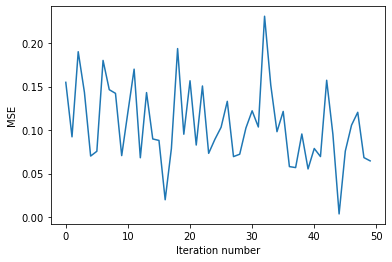

In [79]:
%pylab inline
plot(range(50), stoch_errors_by_iter[:50])
xlabel('Iteration number')
ylabel('MSE')
plt.show()

**Теперь посмотрим на зависимость ошибки от номера итерации для $10^5$ итераций стохастического градиентного спуска. Видим, что алгоритм сходится.**

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


Text(0, 0.5, 'MSE')

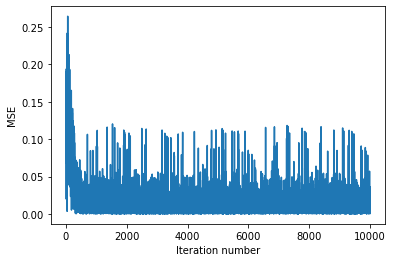

In [80]:
%pylab inline
plot(range(len(stoch_errors_by_iter)), stoch_errors_by_iter)
xlabel('Iteration number')
ylabel('MSE')

**Посмотрим на вектор весов, к которому сошелся метод.**

In [81]:
stoch_grad_desc_weights

array([13.99534134,  3.86257305,  2.75067174, -0.10973118])

**Посмотрим на среднеквадратичную ошибку на последней итерации.**

In [82]:
stoch_errors_by_iter[-1]

0.007058932741832983

**Какова среднеквадратичная ошибка прогноза значений Sales в виде линейной модели с весами, найденными с помощью градиентного спуска? Полученный результат, округленный до 3 знаков после запятой, является ответом на *'4 задание'*.**

In [83]:
answer4 = mserror(y, linear_prediction(X, stoch_grad_desc_weights))
print(round(answer4, 3))

2.801
